<a href="https://colab.research.google.com/github/MehrdadGh1989/Network-Analysis/blob/main/Social_Research_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Eurovision Contest - Network and Sentiment Analysis

## Importing Necessary Libraries

In [99]:
from google.colab import files
uploaded = files.upload()

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import collections
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.cluster import KMeans


In [3]:
# Libraries for NETWORK Analysis
import networkx as nx
import community
import geopandas as gpd
from networkx.algorithms import community
import community as community_louvain

In [5]:
#Libraries for SENTIMENT Analysis
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8')


from sklearn.feature_extraction.text import CountVectorizer


import nltk
from textblob import TextBlob
from nltk import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

## Importing the Data Sets

In [6]:
#For Network Analysis
eurovision_votes_1975_2019 = pd.read_excel('eurovision_song_contest_1975_2019.xlsx')
#For Sentiment Analysis
Eurovision_lyrics2022= pd.read_json("eurovision_lyrics_2022.json").transpose()
#Some Information For Data exploration and Data Visualization
contests__1956_2020 = pd.read_csv('contestants__1956_2020.csv')

In [7]:
#eurovision_votes_1975_2019 DataFrame and cleaning
eurovision_votes_1975_2019= eurovision_votes_1975_2019.drop(['Duplicate'],axis=1)

In [8]:
eurovision_votes_1975_2019

,Year,(semi-) final,Edition,Jury or Televoting,From country,To country,Points
0,1975,f,1975f,J,Belgium,Belgium,0
1,1975,f,1975f,J,Belgium,Finland,0
2,1975,f,1975f,J,Belgium,France,2
3,1975,f,1975f,J,Belgium,Germany,0
4,1975,f,1975f,J,Belgium,Ireland,12
...,...,...,...,...,...,...,...
49827,2019,f,2019f,J,Belarus,Greece,0
49828,2019,f,2019f,J,Belarus,Germany,8
49829,2019,f,2019f,J,Belarus,Belarus,0
49830,2019,f,2019f,J,Belarus,The Netherlands,0


In [9]:
Eurovision_lyrics2022 = Eurovision_lyrics2022.drop(['#.1','Host_City','Host_Country','Eurovision_Number','Pl.','#','Song'], axis=1)

In [10]:
Eurovision_lyrics2022

,Country,Artist,Language,Sc.,Year,Lyrics,Lyrics translation
0,Netherlands,Jetty Paerl,Dutch,-,1956,De vogels van Holland zijn zo muzikaal\nZe ler...,The birds of Holland are so musical\nThey alre...
1,Switzerland,Lys Assia,German,-,1956,Das alte Karussell\nDas geht nicht mehr so sch...,The old carousel\nIt doesn't go as fast anymor...
2,Belgium,Fud Leclerc,French,-,1956,Messieurs les noyés de la Seine\nOuvrez-moi le...,Ye drowned men of the river Seine (1)\nOpen th...
3,Germany (West),Walter Andreas Schwarz,German,-,1956,Es gibt einen Hafen\nDa fährt kaum ein Schiff\...,There is a harbour\nWhere hardly any ship leav...
4,France,Mathé Altéry,French,-,1956,"Chante, carillon\nLe chant du temps perdu\nCha...","Sing, carillon\nThe song of lost time\nSing yo..."
...,...,...,...,...,...,...,...
1679,Sweden,Cornelia Jakobs,English,438,2022,No need to apologise\nCuz there‘s nothing to r...,English
1680,Switzerland,Marius Bear,English,78,2022,"In my room, lives a boy who could be blue,\nAn...",English
1681,The Netherlands,S10,Dutch,171,2022,"Ken je het gevoel dat, dat je droom niet uitko...",Do you know the feeling\nYour dream is never c...
1682,Ukraine,Kalush Orchestra,Ukrainian,631,2022,"Стефанія мамо мамо Стефанія,\nРозквітає поле, ...",Mother Stephania Stephania mother\nThe field i...


In [11]:
contests__1956_2020=contests__1956_2020.drop(['to_country_id','performer','song','sf_num','running_sf','running_final','place_sf','points_sf','points_tele_final','points_jury_sf','composers','youtube_url','lyrics','lyricists','points_tele_sf'],axis=1)

In [12]:
contests__1956_2020

,year,to_country,place_contest,place_final,points_final,points_jury_final
0,1956,Switzerland,2.0,2.0,NaN,NaN
1,1956,Netherlands,2.0,2.0,NaN,NaN
2,1956,Belgium,2.0,2.0,NaN,NaN
3,1956,Germany,2.0,2.0,NaN,NaN
4,1956,France,2.0,2.0,NaN,NaN
...,...,...,...,...,...,...
1598,2020,Finland,NaN,NaN,NaN,NaN
1599,2020,Georgia,NaN,NaN,NaN,NaN
1600,2020,Latvia,NaN,NaN,NaN,NaN
1601,2020,Portugal,NaN,NaN,NaN,NaN


# Data Exploration and Data Visualization

### 1- Changes in the Number of Participating Countries over time

In [13]:
# Assuming you have a DataFrame called 'contests__1956_2020' containing the necessary data


country_counts = contests__1956_2020.groupby('year')['to_country'].count().reset_index()


fig = px.line(country_counts, x='year', y='to_country', color_discrete_sequence=px.colors.qualitative.Set1)


fig.update_layout(
    title='Number of Countries Participating in Contests (1956-2019)',
    xaxis_title='Year',
    yaxis_title='Number of Countries',
    xaxis=dict(dtick=5),
    yaxis=dict(tickmode='linear', dtick=10),
    hovermode='x unified'
)

# Interactive HTML for exploration
fig.write_html("countries_participation.html")


### 2- Eurovision Scores by Country Over Time- Dynamic Choropleth Map

In [14]:
# Convert non-numeric values to NaN
Eurovision_lyrics2022['Sc.'] = pd.to_numeric(Eurovision_lyrics2022['Sc.'], errors='coerce')

# Replace NaN values with 0
Eurovision_lyrics2022['Sc.'] = Eurovision_lyrics2022['Sc.'].fillna(0)

# Group the data by 'Year' and 'Country' and calculate the mean of 'Sc.'
aggregated_data = Eurovision_lyrics2022.groupby(['Year', 'Country'])['Sc.'].mean().reset_index()
# Sort the aggregated_data DataFrame by 'Year'
aggregated_data_sorted = aggregated_data.sort_values('Year')

In [18]:
aggregated_data_sorted = aggregated_data.sort_values('Year')

fig = px.choropleth(
    aggregated_data_sorted,
    locations='Country',
    locationmode='country names',
    color='Sc.',
    color_continuous_scale='YlOrRd',  # Change the color scale to 'Viridis'
    hover_data=['Country', 'Sc.', 'Year'],
    animation_frame='Year',
    title='Score by Country Over Time'
)

fig.update_layout(
    coloraxis_colorbar=dict(title='Score'),
    height=600,  # Adjust the height of the plot
    width=900,  # Adjust the width of the plot
)

fig.show()

### 3- Eurovision Winning Countries - From 1956_2020

/tmp/ipython-input-1831072832.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




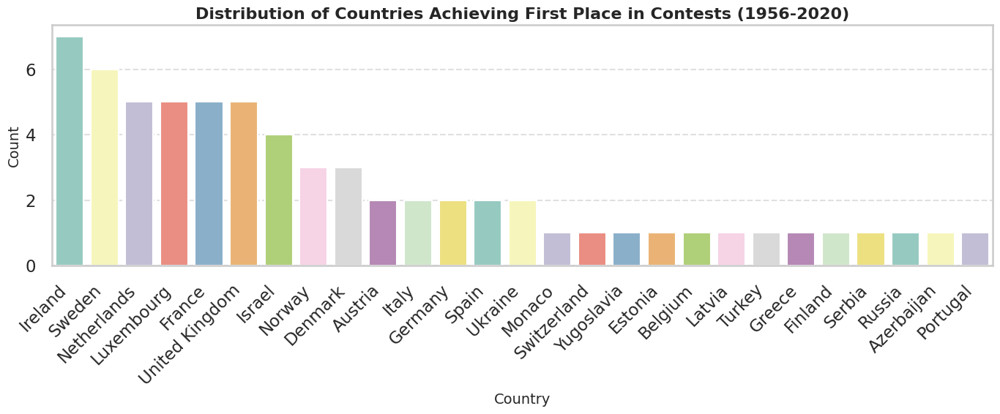

In [23]:

import seaborn as sns


# Data: countries that got first place
first_place_data = contests__1956_2020.loc[
    contests__1956_2020['place_final'] == 1, ['to_country']
]

# Count the number of wins per country
country_counts = first_place_data['to_country'].value_counts().sort_values(ascending=False)

# Set Seaborn style for scientific/clean look
sns.set(style="whitegrid", context="talk")

# Plot
plt.figure(figsize=(14,6))
sns.barplot(
    x=country_counts.index,
    y=country_counts.values,
    palette=sns.color_palette("Set3", n_colors=len(country_counts))
)

# Title and labels
plt.title('Distribution of Countries Achieving First Place in Contests (1956-2020)',
          fontsize=16, fontweight='bold')
plt.xlabel('Country', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Rotate x-axis labels if many countries
plt.xticks(rotation=45, ha='right')

# Add gridlines for readability
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


### 4- Which Countries Receive the Most (12 and 0) Scores

In [24]:
#Achieving 12 Score
eurovision_votes_1975_2019.rename(columns={'Points      ': 'Points'}, inplace=True)
Achieving_12 = eurovision_votes_1975_2019[eurovision_votes_1975_2019['Points'] == 12][['Jury or Televoting', 'From country', 'To country' ,'Points' ]]
MostMin_12_Country= Achieving_12['To country'].value_counts()
MostMin_12_Country_df = pd.DataFrame(MostMin_12_Country);
#############################################################
#Achieving 0 Score
Achieving_0 = eurovision_votes_1975_2019[eurovision_votes_1975_2019['Points'] == 0][['Jury or Televoting', 'From country', 'To country' ,'Points' ]]
MostMin_0_Country=Achieving_0['To country'].value_counts()
MostMin_0_Country_df = pd.DataFrame(MostMin_0_Country);
first_12countries = MostMin_12_Country_df.head(5)
first_0countries = MostMin_0_Country_df.head(5)

In [31]:
first_12countries.reset_index(inplace=True)



In [34]:
first_12countries

,To country,count
0,Sweden,157
1,Russia,108
2,Greece,89
3,Norway,81
4,Denmark,81


### 5- The Eurovision Winners in different parts of Europe

In [38]:
df2 = contests__1956_2020.loc[contests__1956_2020['place_final'] == 1, ['to_country']]
counts = df2['to_country'].value_counts()

print("Number of Countries:", len(counts))
print("Number of 1st Ranks by Country:")


Number of Countries: 27
Number of 1st Ranks by Country:


In [39]:
DF_Region = pd.DataFrame({'Country': ['Ireland', 'Sweden', 'Netherlands', 'Luxembourg', 'France', 'United Kingdom', 'Israel', 'Norway', 'Denmark', 'Spain', 'Ukraine', 'Austria', 'Italy', 'Germany', 'Azerbaijan', 'Russia', 'Serbia', 'Finland', 'Greece', 'Estonia', 'Turkey', 'Latvia', 'Monaco', 'Yugoslavia', 'Switzerland', 'Belgium', 'Portugal'],
                   'Rank': [7, 6, 5, 5, 5, 5, 4, 3, 3, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]})

# Define the mapping dictionary for continent regions
continent_mapping = {
    'Ireland': 'Western Europe','Sweden': 'Northern Europe','Netherlands': 'Western Europe','Luxembourg': 'Western Europe',
    'France': 'Western Europe','United Kingdom': 'Western Europe','Israel': 'Western Asia','Norway': 'Northern Europe',
    'Denmark': 'Northern Europe', 'Spain': 'Southern Europe', 'Ukraine': 'Eastern Europe', 'Austria': 'Western Europe',
    'Italy': 'Southern Europe', 'Germany': 'Western Europe',  'Azerbaijan': 'Western Asia',  'Russia': 'Eastern Europe',
    'Serbia': 'Southern Europe', 'Finland': 'Northern Europe', 'Greece': 'Southern Europe', 'Estonia': 'Northern Europe',
    'Turkey': 'Western Asia', 'Latvia': 'Northern Europe', 'Monaco': 'Western Europe', 'Yugoslavia': 'Southern Europe',
    'Switzerland': 'Western Europe','Belgium': 'Western Europe','Portugal': 'Southern Europe',
    # Non-European countries
    'Turkey': 'Other Countries',
    'Israel': 'Other Countries',
}

# Create the new column 'Continent' using the mapping dictionary
DF_Region['Regional Indicator'] =DF_Region['Country'].map(continent_mapping)


/tmp/ipython-input-1839277947.py:32: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



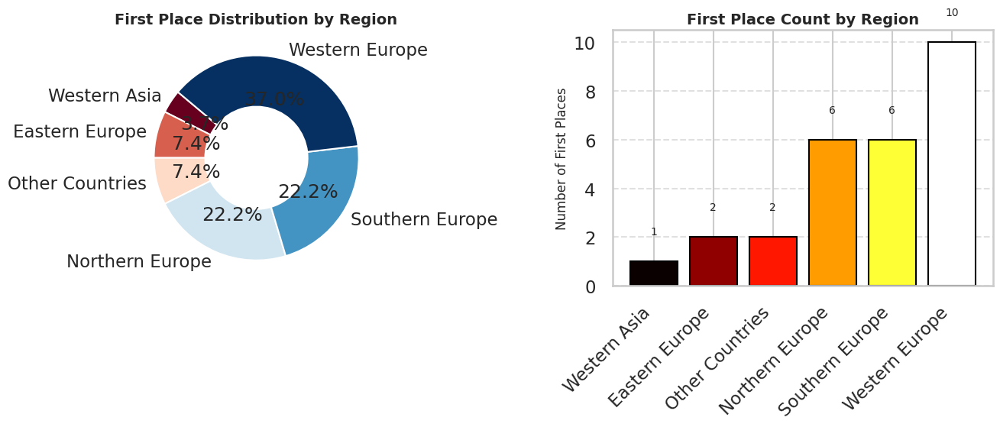

In [41]:

region_counts = DF_Region.groupby('Regional Indicator')['Rank'].count().sort_values()
regions = region_counts.index
counts = region_counts.values


sns.set(style="whitegrid", context="talk")


fig, axes = plt.subplots(1, 2, figsize=(14, 6))


axes[0].pie(
    counts,
    labels=regions,
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.cm.RdBu(np.linspace(0, 1, len(counts))),
    wedgeprops=dict(width=0.5, edgecolor='w')
)
axes[0].set_title("First Place Distribution by Region", fontsize=14, fontweight='bold')


bars = axes[1].bar(
    regions,
    counts,
    color=plt.cm.hot(np.linspace(0, 1, len(counts))),
    edgecolor='black'
)
axes[1].set_title("First Place Count by Region", fontsize=14, fontweight='bold')
axes[1].set_ylabel("Number of First Places", fontsize=12)
axes[1].set_xticklabels(regions, rotation=45, ha='right')
axes[1].grid(axis='y', linestyle='--', alpha=0.6)


for bar, count in zip(bars, counts):
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2, height + 1, f'{count}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


### 6- Changing the Position of Countries from 2004 to 2019

In [42]:
condition = (contests__1956_2020['year'] >= 2004) & (contests__1956_2020['year'] <= 2019)
subset_1956_2020 = contests__1956_2020.loc[condition, ['year','to_country', 'place_contest', 'points_final']]
subset_1956_2020.fillna(0, inplace=True)

In [43]:
# To find the repeated countries from 2004 to 2019
years = range(2004, 2019)
all_years_countries = set()

for year in years:
    countries = set(subset_1956_2020.loc[subset_1956_2020['year'] == year, 'to_country'])
    if len(all_years_countries) == 0:
        all_years_countries = countries
    else:
        all_years_countries = all_years_countries.intersection(countries)

print("Countries that repeated in all the years from 2004 to 2019:")
print(", ".join(all_years_countries))

Countries that repeated in all the years from 2004 to 2019:
Spain, Germany, Albania, Norway, Finland, Belarus, Ireland, Belgium, Denmark, Malta, Slovenia, Latvia, Lithuania, Iceland, Netherlands, France, United Kingdom, Estonia, North Macedonia, Israel, Greece, Switzerland, Sweden


In [44]:
#To Create a New DataSet
countries_to_keep = ['Estonia', 'France', 'United Kingdom', 'Belgium', 'Lithuania', 'Norway', 'Israel',
                     'Denmark', 'Greece', 'Germany', 'Iceland', 'Sweden', 'Spain', 'Albania', 'Belarus',
                     'Malta', 'Switzerland', 'North Macedonia', 'Ireland', 'Finland', 'Netherlands',
                     'Slovenia', 'Latvia']

filtered_subset_1956_2020 = subset_1956_2020[subset_1956_2020['to_country'].isin(countries_to_keep)]

In [45]:
# Create a dictionary of country-population mappings for DATAFRAME
population = {
    'Estonia': 1328976, 'France': 67391582,'United Kingdom': 67886011, 'Belgium': 11589623, 'Lithuania': 2722289, 'Norway': 5421241,
    'Israel': 9197590, 'Denmark': 5822763, 'Greece': 10423054, 'Germany': 83783942, 'Iceland': 366425, 'Sweden': 10353414,
    'Spain': 47329981, 'Albania': 2877797, 'Belarus': 9449321, 'Malta': 441543, 'Switzerland': 8654622, 'North Macedonia': 2077132,
    'Ireland': 4982907, 'Finland': 5532156,'Netherlands': 17173000,'Slovenia': 2079976, 'Latvia': 1918500
}

# Add a new column 'Population' to the 'subset_1956_2019' DataFrame and map the population values
filtered_subset_1956_2020 ['Population'] = filtered_subset_1956_2020 ['to_country'].map(population)

/tmp/ipython-input-705070421.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



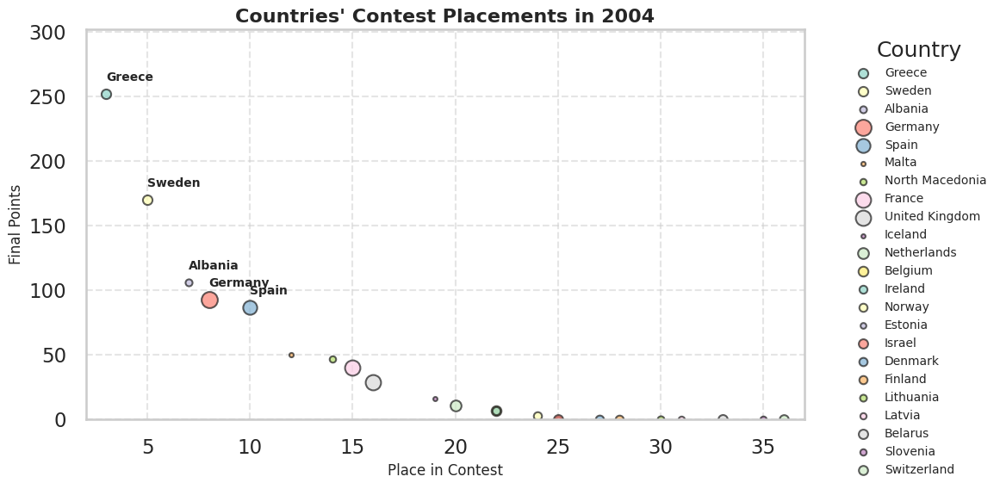

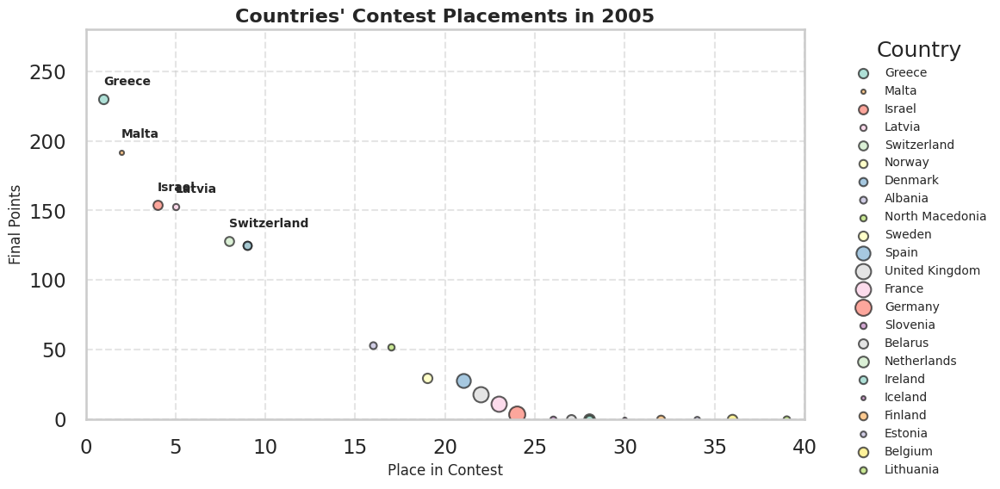

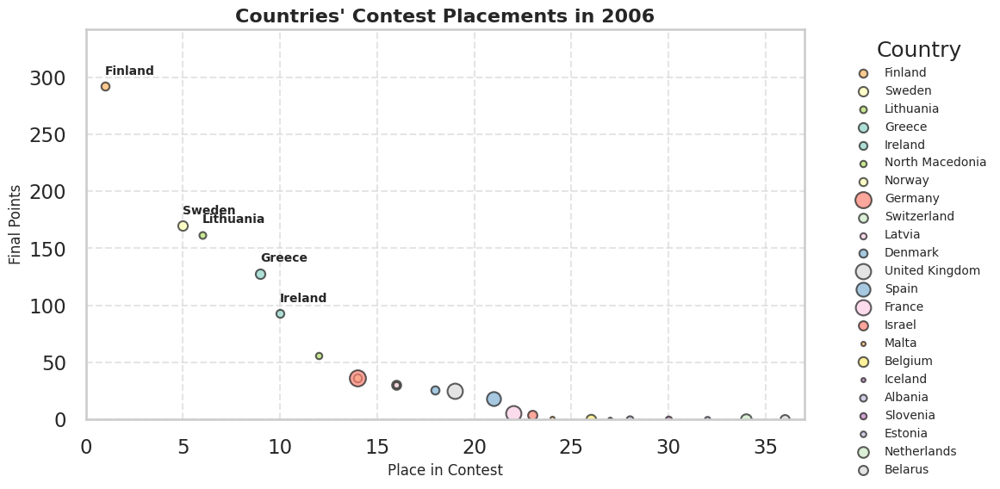

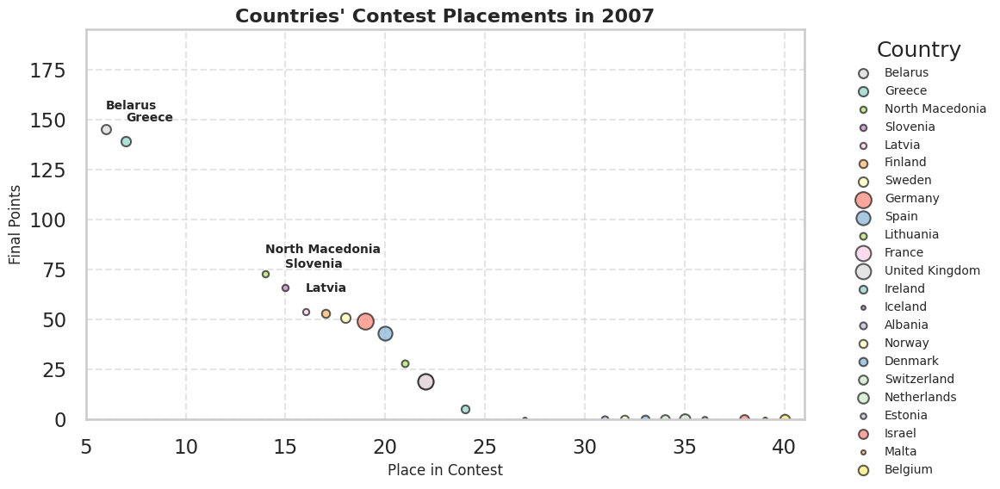

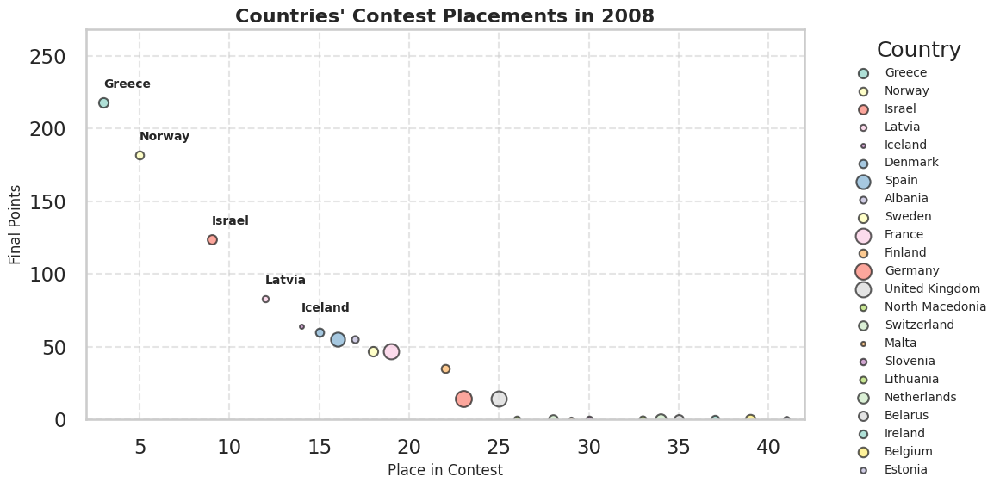

...

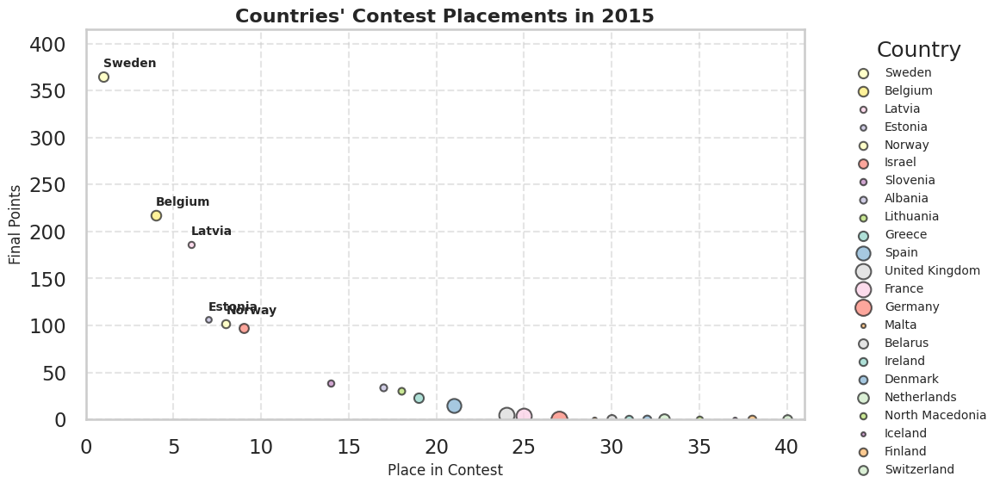

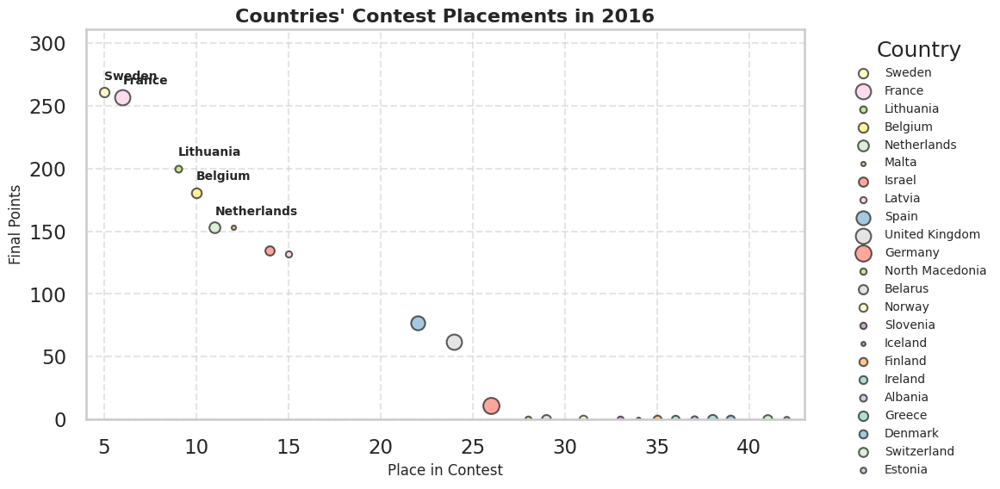

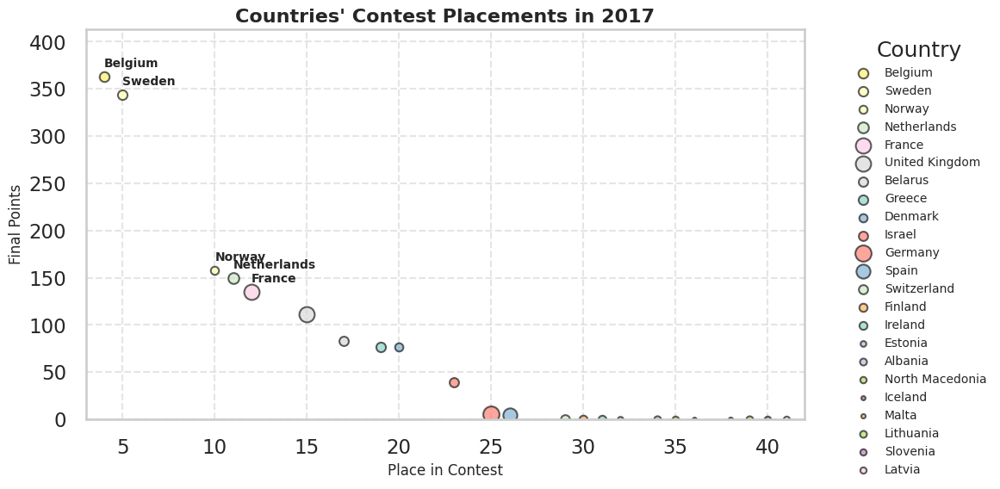

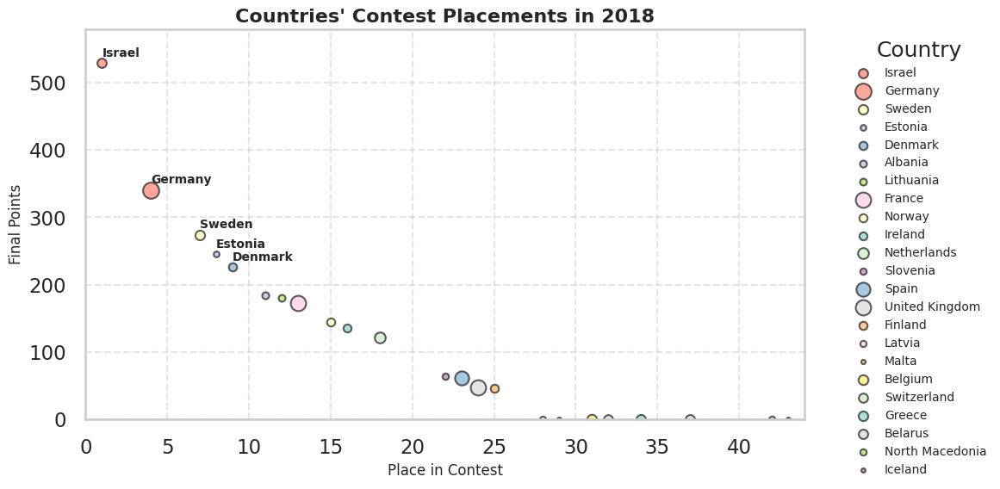

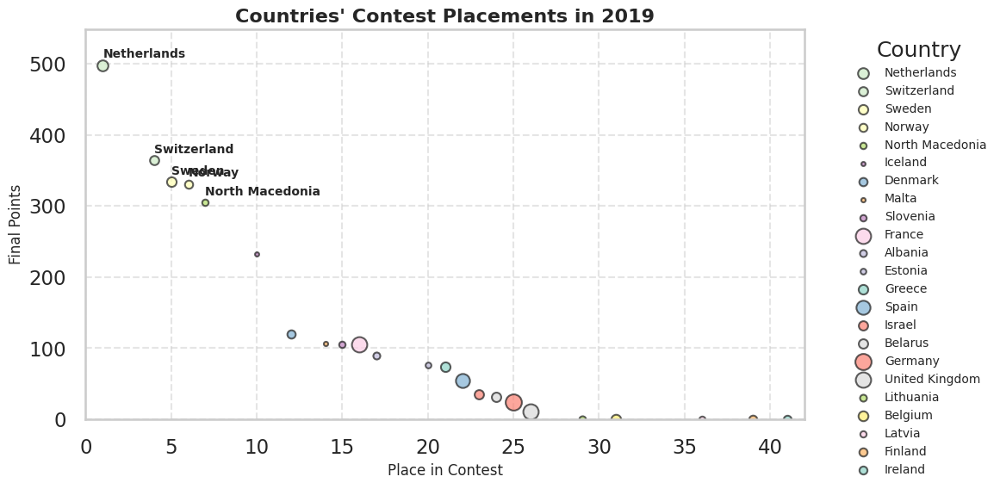

In [47]:

sns.set(style="whitegrid", context="talk")

years = sorted(filtered_subset_1956_2020['year'].unique())
unique_countries = filtered_subset_1956_2020['to_country'].unique()
country_colors = dict(zip(unique_countries, sns.color_palette("Set3", n_colors=len(unique_countries))))

for year in years:
    df_year = filtered_subset_1956_2020[filtered_subset_1956_2020['year'] == year]

    plt.figure(figsize=(12, 6))


    for country in df_year['to_country'].unique():
        df_country = df_year[df_year['to_country'] == country]
        plt.scatter(
            df_country['place_contest'],
            df_country['points_final'],
            s=np.sqrt(df_country['Population']) / 50,
            color=country_colors[country],
            alpha=0.7,
            edgecolors='k',
            label=country
        )


    top_df = df_year.nlargest(5, 'points_final')
    for i, row in top_df.iterrows():
        plt.text(row['place_contest'], row['points_final'] + 10, row['to_country'],
                 fontsize=10, fontweight='bold')

    plt.title(f"Countries' Contest Placements in {year}", fontsize=16, fontweight='bold')
    plt.xlabel("Place in Contest", fontsize=12)
    plt.ylabel("Final Points", fontsize=12)
    plt.xlim(df_year['place_contest'].min() - 1, df_year['place_contest'].max() + 1)
    plt.ylim(0, df_year['points_final'].max() + 50)
    plt.grid(linestyle='--', alpha=0.5)


    plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.tight_layout()
    plt.show()


### 7- Comparison between Pairs of Countries who Votes Each other

In [48]:
eurovision_votes_1975_2019 = eurovision_votes_1975_2019.rename(columns={'Points      ': 'Points'})

In [49]:
#subset From 1975 to 2019
Subset_1975_2019 = eurovision_votes_1975_2019[['Year','From country','To country','Points']]
#Subset_df.rename(columns={'Points      ': 'Points'}, inplace=True)
#Subset_1975_2019

#### The total points that from Each country to other Countries from 1975 to 2019

In [51]:
from_countries = Subset_1975_2019['From country'].unique()


all_total_points_list = []

for country in from_countries:
    country_points = Subset_1975_2019[Subset_1975_2019['From country'] == country]


    total_points_given = (
        country_points.groupby('To country')['Points']
        .sum()
        .reset_index()
        .rename(columns={'Points': 'Points_Total'})
    )


    total_points_given['From country'] = country
    total_points_given = total_points_given[['From country', 'To country', 'Points_Total']]


    all_total_points_list.append(total_points_given)


all_total_points_given = pd.concat(all_total_points_list, ignore_index=True)


all_total_points_given.head()



,From country,To country,Points_Total
0,Belgium,Albania,63
1,Belgium,Andorra,0
2,Belgium,Armenia,126
3,Belgium,Australia,89
4,Belgium,Austria,131


#### Find the Max Score that Each Country of From Country List have given

In [52]:
# The Max points that Each country in the from country has given to:
all_total_points_given['Points_Total'] = pd.to_numeric(all_total_points_given['Points_Total'], errors='coerce')

# Group the data by 'From country' and find the row index with the maximum 'Points_Total' for each group
max_points_idx = all_total_points_given.groupby('From country')['Points_Total'].idxmax()

# Filter the DataFrame based on the maximum points indices
max_points_df = all_total_points_given.loc[max_points_idx]



#### Find the Revese Score of the Above Results

In [53]:
#Creating 2 lists of From country & To country columns in max_points_df
# Assume you have a DataFrame called 'df' with columns 'From country', 'To country', 'Points_Total'

# Create empty lists to store the values
from_country_list = []
to_country_list = []

# Iterate over the DataFrame rows and extract values for 'From country' and 'To country'
for index, row in max_points_df.iterrows():
    from_country_list.append(row['From country'])
    to_country_list.append(row['To country'])

# Display the lists
print(from_country_list)
print(to_country_list)

['Albania', 'Andorra', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia & Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'F.Y.R. Macedonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg', 'Macedonia', 'Malta', 'Moldova', 'Monaco', 'Montenegro', 'Morocco', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Serbia & Montenegro', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'The Netherands', 'The Netherlands', 'Turkey', 'Ukraine', 'United Kingdom', 'Yugoslavia']
['Greece', 'Portugal', 'Russia', 'Sweden', 'Ireland', 'Russia', 'Ukraine', 'The Netherlands', 'Croatia', 'Greece', 'Bosnia & Herzegovina', 'Greece', 'Azerbaijan', 'Sweden', 'Russia', 'Albania', 'Sweden', 'Israel', 'Azerbaijan', 'Sweden', 'Cyprus', 'The Netherlands', 'Sweden', 'Sweden', 'Sweden', 'France', 'Russ

In [54]:
# Assume you have a DataFrame called 'df' with columns 'From country', 'To country', 'Points_Total'

# Create two lists of countries to filter
from_country_list1 = ['Albania', 'Andorra', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium',
                      'Bosnia & Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia',
                      'F.Y.R. Macedonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland',
                      'Ireland', 'Israel', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg', 'Macedonia', 'Malta', 'Moldova',
                      'Monaco', 'Montenegro', 'Morocco', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania', 'Russia',
                      'San Marino', 'Serbia', 'Serbia & Montenegro', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland',
                      'The Netherands', 'The Netherlands', 'Turkey', 'Ukraine', 'United Kingdom', 'Yugoslavia']

to_country_list1 = ['Greece', 'Portugal', 'Russia', 'Sweden', 'Ireland', 'Russia', 'Ukraine', 'The Netherlands', 'Croatia',
                    'Greece', 'Bosnia & Herzegovina', 'Greece', 'Azerbaijan', 'Sweden', 'Russia', 'Albania', 'Sweden', 'Israel',
                    'Azerbaijan', 'Sweden', 'Cyprus', 'The Netherlands', 'Sweden', 'Sweden', 'Sweden', 'France', 'Russia', 'Latvia',
                    'United Kingdom', 'Serbia', 'Sweden', 'Romania', 'France', 'Serbia', 'Turkey', 'Albania', 'Sweden', 'Ukraine', 'Italy',
                    'Moldova', 'Armenia', 'Greece', 'Hungary', 'F.Y.R. Macedonia', 'Estonia', 'Serbia', 'Portugal', 'Denmark', 'Ireland',
                    'Germany', 'Sweden', 'Bosnia & Herzegovina', 'Belarus', 'Ireland', 'Italy']

#mapping_dict = dict(zip(to_country_list1, from_country_list1 ))

#max_points_df_reverse = all_total_points_given.loc[(all_total_points_given['From country'].isin(mapping_dict.keys())) & (all_total_points_given['To country'].isin(mapping_dict.values()))]

conditions = [(all_total_points_given['From country'] == value1) & (all_total_points_given['To country'] == value2) for value1, value2 in zip(to_country_list1,from_country_list1)]
max_points_df_reverse  = all_total_points_given.loc[np.any(conditions, axis=0)]
max_points_df_reverse  = max_points_df_reverse .rename(columns={'From country': 'From country1', 'To country': 'To country1', 'Points_Total': 'Points_Total1' })

In [55]:
# To Pair the Countries
Pair_Countries = pd.merge(max_points_df, max_points_df_reverse, left_on=["From country"], right_on=["To country1"])
Pair_Countries ['Absolute_Difference'] = abs(Pair_Countries['Points_Total'] - Pair_Countries['Points_Total1'])


In [56]:
#To Show Countries Who Votes each other:

# Define a function to highlight rows based on the condition
def highlight_rows(row):
    if abs(row['Points_Total'] - row['Points_Total1']) < 20:
        return ['background-color: yellow'] * len(row)
    else:
        #return [''] * len(row)

        if abs(row['Points_Total'] - row['Points_Total1']) > 100 :
            return ['background-color: red'] * len(row)
        else:
            return [''] * len(row)

# Apply the function to the DataFrame
styled_df = Pair_Countries.style.apply(highlight_rows, axis=1)

# Display the styled DataFrame
styled_df

,From country,To country,Points_Total,From country1,To country1,Points_Total1,Absolute_Difference
0,Albania,Greece,230,Greece,Albania,206,24
1,Andorra,Portugal,64,Portugal,Andorra,10,54
2,Armenia,Russia,217,Russia,Armenia,187,30
3,Australia,Sweden,104,Sweden,Australia,96,8
4,Austria,Ireland,196,Ireland,Austria,129,67
5,Azerbaijan,Russia,182,Russia,Azerbaijan,187,5
6,Belarus,Ukraine,215,Ukraine,Belarus,155,60
7,Belgium,The Netherlands,249,The Netherlands,Belgium,210,39
8,Bosnia & Herzegovina,Croatia,176,Croatia,Bosnia & Herzegovina,194,18
9,Bulgaria,Greece,112,Greece,Bulgaria,71,41


- Note:
- 20) CONSIDER: GREECE to CYPRUS: The Max Score (the Summation of scores) that GREECE Has given to (Which country among these Years = Cyprus).

# Analysing Data (Clustering - Network Analysis- Sentiment Analysis)

## 1- Clustering

In [57]:
eurovision_votes_1975_2019

,Year,(semi-) final,Edition,Jury or Televoting,From country,To country,Points
0,1975,f,1975f,J,Belgium,Belgium,0
1,1975,f,1975f,J,Belgium,Finland,0
2,1975,f,1975f,J,Belgium,France,2
3,1975,f,1975f,J,Belgium,Germany,0
4,1975,f,1975f,J,Belgium,Ireland,12
...,...,...,...,...,...,...,...
49827,2019,f,2019f,J,Belarus,Greece,0
49828,2019,f,2019f,J,Belarus,Germany,8
49829,2019,f,2019f,J,Belarus,Belarus,0
49830,2019,f,2019f,J,Belarus,The Netherlands,0


## Hierarchical Clustering with Dendrogram (2016)

#### Clustering:
- Cluster analysis is a statistical technique used to CLASSIFY or group SIMILAR OBJECTS OR OBSERVATIONS based on their characteristics or attributes.
- The Aim: IDENTIFY INHERENT PATTERNS or STRUCTURES within a datase.

#### Hierarchical clustering:
- Hierarchical structure of clusters based on the similarity or dissimilarity between data points.



- Divisive clustering (Top-Down) starts with a single cluster and iteratively splits it into Smaller Clusters. Hierarchical clustering results in a DENDROGRAM, a tree-like structure that visually represents the clustering process.

In [58]:
# Create a Subset for Clustering.
filtered_subset1 = eurovision_votes_1975_2019[(eurovision_votes_1975_2019['Edition'] == '2016f') &

                                              (eurovision_votes_1975_2019['Jury or Televoting'] == 'T')]
filtered_subset1
#Remove the dublicated rows

,Year,(semi-) final,Edition,Jury or Televoting,From country,To country,Points
36352,2016,f,2016f,T,Albania,Armenia,2
36353,2016,f,2016f,T,Albania,Australia,12
36354,2016,f,2016f,T,Albania,Austria,0
36355,2016,f,2016f,T,Albania,Azerbaijan,0
36356,2016,f,2016f,T,Albania,Belgium,0
...,...,...,...,...,...,...,...
37413,2016,f,2016f,T,United Kingdom,Serbia,0
37414,2016,f,2016f,T,United Kingdom,Spain,4
37415,2016,f,2016f,T,United Kingdom,Sweden,1
37416,2016,f,2016f,T,United Kingdom,The Netherlands,0


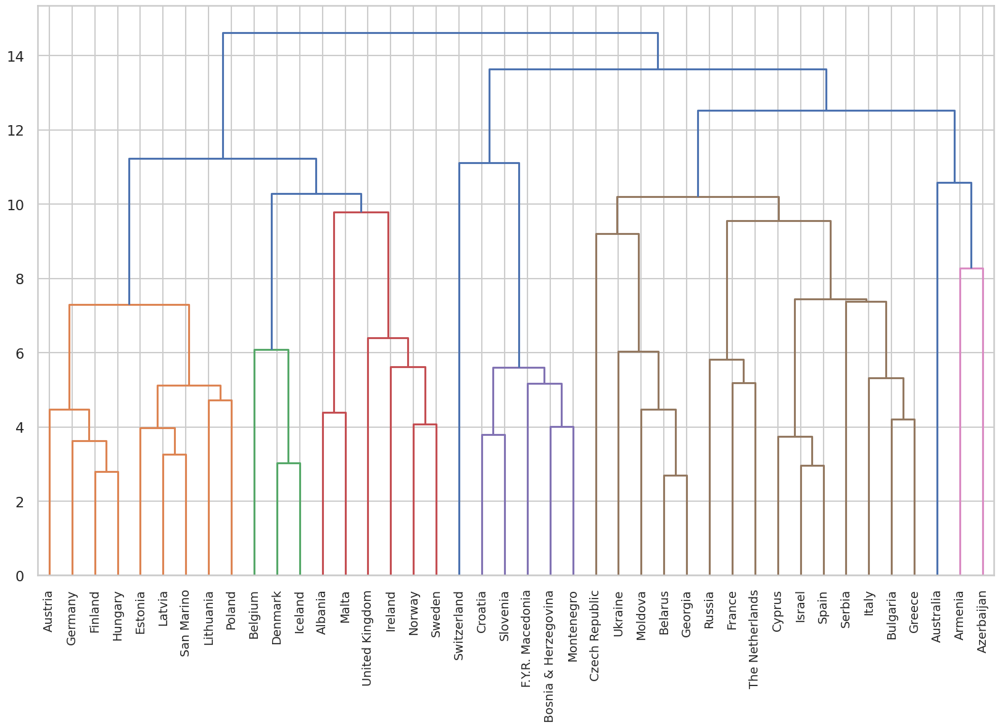

Number of Clusters: 6


In [59]:
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.vq import whiten

from scipy.cluster.hierarchy import fcluster

%matplotlib inline

Points = filtered_subset1.pivot_table(index='From country', columns='To country', values='Points', aggfunc='sum')

Points.fillna(1, inplace=True)

df_scaled = whiten(Points.to_numpy())

mergings = linkage(df_scaled, method='ward')

plt.figure(figsize=(20, 12))
dn = dendrogram(
    mergings,
    labels=np.array(Points.index),
    leaf_rotation=90,
    leaf_font_size=14
)

plt.show()


threshold = 11

cluster_labels = fcluster(mergings, threshold, criterion='distance')

num_clusters = len(np.unique(cluster_labels))

print("Number of Clusters:", num_clusters)



## Clustering with K-Means (2016)

In [60]:
from sklearn.cluster import KMeans


np.random.seed(42)


Points = filtered_subset1.pivot_table(index='From country', columns='To country', values='Points', aggfunc='sum')

# Fill any missing values with 1
Points.fillna(1, inplace=True)


data_array = Points.to_numpy()


n_clusters = 6


kmeans = KMeans(n_clusters=n_clusters, random_state=42)


kmeans.fit(data_array)


cluster_labels = kmeans.labels_

Points['Cluster'] = cluster_labels


cluster_names = []
for i in range(n_clusters):
    cluster_countries = Points[Points['Cluster'] == i].index.tolist()
    cluster_names.append(cluster_countries)

for i, cluster in enumerate(cluster_names):
    print(f"Cluster {i+1}: {cluster}")

Cluster 1: ['Austria', 'Bulgaria', 'Czech Republic', 'Estonia', 'Finland', 'Germany', 'Hungary', 'Lithuania', 'Poland', 'Russia']
Cluster 2: ['Albania', 'Malta', 'Serbia']
Cluster 3: ['Belgium', 'Denmark', 'Iceland', 'The Netherlands']
Cluster 4: ['Belarus', 'Georgia', 'Ireland', 'Latvia', 'Norway', 'San Marino', 'Sweden', 'Ukraine', 'United Kingdom']
Cluster 5: ['Armenia', 'Australia', 'Azerbaijan', 'Cyprus', 'France', 'Greece', 'Israel', 'Italy', 'Moldova', 'Spain']
Cluster 6: ['Bosnia & Herzegovina', 'Croatia', 'F.Y.R. Macedonia', 'Montenegro', 'Slovenia', 'Switzerland']


## Network Analysis (Louvian Modularity Community Detection)

- 1) AIM: Louvain Modularity Community detection to see whether there are Geography-Based Voting Blocks.
- 2) Nodes Represent Countries in the Competition.

#### Note: The Meaning of Being in the Same Community:
- 1) In the Eurovision contest, being in the same community refers to countries that exhibit SIMILAR (Voting Behavior. Similar behaviours, such as: Mutual Voting, Regional Blocks, Political Voting, Language Bias, Consistent Preferences).


- 2) Distance Distribution: Nodes with STRONG CONNECTION or SIMILAR CHARACTERISTICS are often positioned closer together to reflect their stronger relationships or similarities.

In [61]:

import community
#The Louvain Modularity algorithm is a popular method for community detection in networks/graphs.
#Based on the concept of modularity, which is a measure of the quality of a community structure in a network.

def detect_community(df, year_from, year_to):
    np.random.seed(42)
    global selected_df
    # compile vote matrix for selected years
    #Groups the selected DataFrame by 'From country' and 'To country' columns and sums the 'Points' for each pair of countries.
    selected_df = df[df['Year'].between(year_from, year_to)]
    selected_df = selected_df.groupby(['From country', 'To country'])['Points'].sum()
# The original voting data may be represented in a tabular form
# However, For community detection and network analysis, it is more convenient to work with a vote matrix that shows the aggregated voting interactions between all pairs of countries.
# Unstacking the 'To country' index means transforming the tabular representation into a matrix format.  the rows represent the 'From country', the columns represent the 'To country', and the matrix elements represent the total number of votes given by each 'From country' to each 'To country'.
    selected_df = selected_df.unstack().fillna(0)
# lOSERS: Identifies any countries present in the 'From country' index but not in the 'To country' columns, BUT which are considered "losers" in the voting process
    losers = list(set(selected_df.index) - set(selected_df.columns))
#: For each loser country, new columns are created in the DataFrame, representing the 'To country', and their values are set to 0. This ensures that all countries have corresponding columns even if they received no votes.
    for loser in losers:
        selected_df[loser] = 0
# Converts the DataFrame to a NumPy array (matrix) for further processing.
    np_matrix = selected_df.values
#Stores the column names (country names) in the variable names.
    names = selected_df.columns
    graph = nx.from_pandas_adjacency(selected_df)
    graph = nx.relabel_nodes(graph, dict(enumerate(names)))
# use Louvain Modularity to identify communities
    part = community.best_partition(graph)
    return graph, part

def visualise(graph, part):
    values = [part.get(node) for node in graph.nodes()]
    plt.figure(figsize=(20, 20))
    #to determine the positions of nodes in the graph.
    pos = nx.spring_layout(graph)
    #Draws the nodes of the graph.
    nx.draw_networkx_nodes(graph, pos, node_size=300, cmap=plt.get_cmap('jet'), node_color=values, alpha=0.5)
    #Draws the labels for the nodes.
    nx.draw_networkx_labels(graph, pos, font_size=18, font_family='sans-serif')
    return

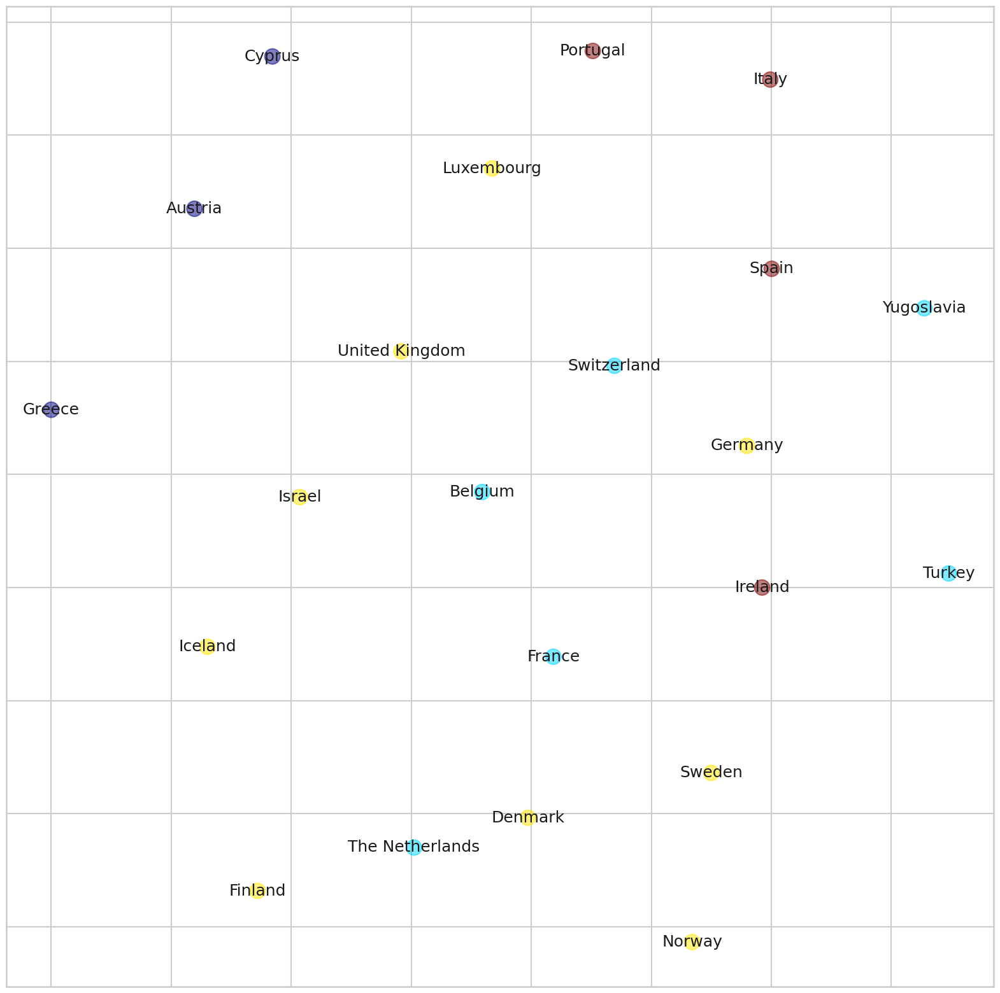

In [62]:
part,graph = detect_community(eurovision_votes_1975_2019,1985,1990)
visualise(part,graph)

In [63]:


def visualise(graph, part):
    values = [part.get(node) for node in graph.nodes()]
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(graph)

    nx.draw_networkx_nodes(graph, pos, node_size=300, cmap=plt.get_cmap('jet'), node_color=values, alpha=0.5)

    nx.draw_networkx_labels(graph, pos, font_size=18, font_family='sans-serif')

    nx.draw_networkx_edges(graph, pos, alpha=0.2)
    plt.axis('off')
    plt.show()

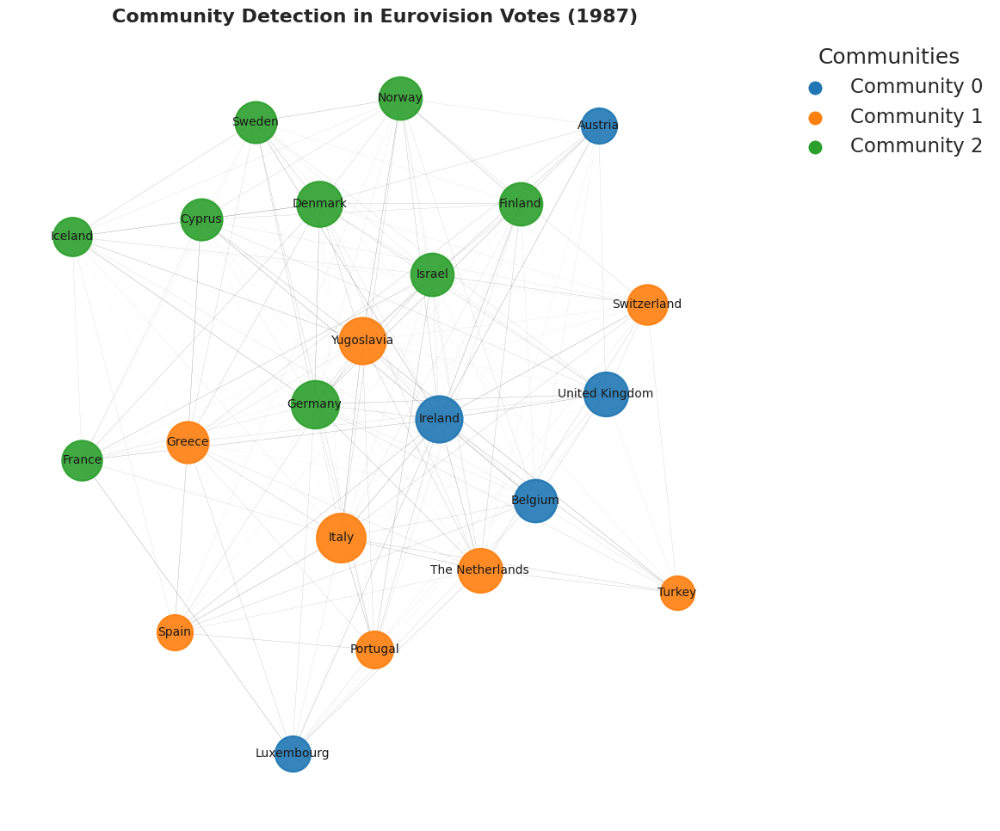

In [66]:

sns.set(style="whitegrid", context="talk")


graph, part = detect_community(eurovision_votes_1975_2019, year_from, year_to)

communities = list(set(part.values()))
num_communities = len(communities)


palette = sns.color_palette("tab10", n_colors=num_communities)
community_colors = {comm: palette[i] for i, comm in enumerate(communities)}


pos = nx.spring_layout(graph, seed=42, k=0.3)

plt.figure(figsize=(12, 10))

# Draw nodes
for node in graph.nodes():
    nx.draw_networkx_nodes(
        graph,
        pos,
        nodelist=[node],
        node_size=graph.degree(node)*80,
        node_color=[community_colors[part[node]]],
        alpha=0.9
    )


edges, weights = zip(*nx.get_edge_attributes(graph, 'weight').items())
nx.draw_networkx_edges(graph, pos, edgelist=edges, width=[w*0.02 for w in weights], alpha=0.5)


nx.draw_networkx_labels(graph, pos, font_size=10, font_family='Arial')


for comm, color in community_colors.items():
    plt.scatter([], [], c=[color], label=f'Community {comm}', s=100)
plt.legend(title='Communities', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title(f"Community Detection in Eurovision Votes ({year_from})", fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()


### Analysing the Power of the Network

- 1) Degree Centrality:

Higher Degree Centrality: Countries with higher degree centrality have more connections (edges) in the Eurovision network.

- 2) Betweenness Centrality:

Higher Betweenness Centrality: Countries with higher betweenness centrality act as important bridges or mediators between different groups of countries in the Eurovision network.


- 3) Closeness Centrality:

Higher Closeness Centrality: Countries with higher closeness centrality are closer (in terms of shortest paths) to all other countries in the Eurovision network.


In [67]:

# Calculate Degree Centrality
degree_centrality = nx.degree_centrality(graph)

# Calculate Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(graph)

# Calculate Closeness Centrality
closeness_centrality = nx.closeness_centrality(graph)

# Print the metrics for each node (country)
for country in graph.nodes():
    print(f"Country: {country}")
    print(f"Degree Centrality: {degree_centrality[country]}")
    print(f"Betweenness Centrality: {betweenness_centrality[country]}")
    print(f"Closeness Centrality: {closeness_centrality[country]}")
    print("-----------------------")

Country: Austria
Degree Centrality: 0.5238095238095237
Betweenness Centrality: 0.0024978196406767834
Closeness Centrality: 0.6774193548387096
-----------------------
Country: Belgium
Degree Centrality: 0.7619047619047619
Betweenness Centrality: 0.018439378082235225
Closeness Centrality: 0.8076923076923077
-----------------------
Country: Cyprus
Degree Centrality: 0.7142857142857142
Betweenness Centrality: 0.007608449751306894
Closeness Centrality: 0.7777777777777778
-----------------------
Country: Denmark
Degree Centrality: 0.8571428571428571
Betweenness Centrality: 0.018938759653045367
Closeness Centrality: 0.875
-----------------------
Country: Finland
Degree Centrality: 0.7619047619047619
Betweenness Centrality: 0.011544064401207258
Closeness Centrality: 0.8076923076923077
-----------------------
Country: France
Degree Centrality: 0.6666666666666666
Betweenness Centrality: 0.008076857005428435
Closeness Centrality: 0.75
-----------------------
Country: Germany
Degree Centrality: 0.

## Monte Carlo Analysis & Future Pattern detection

Analysis:

- It is a computational method that uses (RANDOM SAMPLING) to approximate solutions to complex problems.
- It is a powerful and widely used computational technique for (Solving Complex Problems), (Estimating Uncertain Quantities), and (Understanding the Behavior of Systems under Uncertainty)
- It involves assigning PROBABILITY DISTRIBUTION to uncertain parameters, generating random samples, and running simulations to obtain results.
- By analyzing the outcomes of many simulations, it provides probabilistic insights into system behavior and estimates unknown quantities.

Prediction:

- Monte Carlo Analysis focuses on uncertainty and probabilistic outcomes. It helps assess the likelihood of different scenarios but does not explicitly aim to forecast future events.

In [68]:
# Constructs the (Vote Distribution) for a specific year in the Eurovision contest.
def get_vote_dist(year):  #construct distribution

    # count the number of voters in that year (specific year)
    voters = len(eurovision_votes_1975_2019[eurovision_votes_1975_2019['Year']==year].groupby('From country').sum().index)
    # subtract 1 to show a country can not vote for itself
    available_votes = voters - 1
    # calcualte vote probabilities. available votes= voters-1
    p_non_zero = 1/available_votes
    p_zero     = (available_votes-10)/available_votes
    #creat distribution
    vote_values = [0,1,2,3,4,5,6,7,8,10,12]
    vote_proba  = np.append([p_zero],np.full((10), p_non_zero))

    return (vote_values,vote_proba)

In [69]:
get_vote_dist(2012)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 12],
 array([0.75609756, 0.02439024, 0.02439024, 0.02439024, 0.02439024,
        0.02439024, 0.02439024, 0.02439024, 0.02439024, 0.02439024,
        0.02439024]))

In [70]:
# Performs a MONTE CARLO Simulation for a specified number of years, Simulation.

def simulate_voting(start_year,end_year,simulations):
    mean_dist = []
    for i in range(simulations):
        print("\r Similation: "+str(i)+" of "+str(simulations), end = "")
        votes = []

        for year in np.arange(start_year,end_year,1):

            vote_values,vote_proba = get_vote_dist(year)    # get vote probability distribution for current year
            vote_sample = np.random.choice(vote_values, 1,p=vote_proba) # sample from distribution
            votes.append(vote_sample)   # append sample to list

        mean_sample = np.mean(votes)
        mean_dist.append(mean_sample)

    return(mean_dist)

In [71]:
# It is used to establish a criterion for determining which voting mean scores are considered significant or above a certain threshold.
def get_threshold(mean_dist,p_val):

    threshold = np.percentile(mean_dist, p_val)
    mean = np.percentile(mean_dist, 50)

    return (threshold)

In [72]:
#This function detect_coalitions is used to detect coalitions in the Eurovision voting data based on certain criteria.
def detect_coalitions(df,test_stat,start_year,end_year):

    # generate real values for these years

    selected_df = df[df['Year'].between(start_year,end_year)]
    selected_df = selected_df.groupby(['From country','To country']).Points.mean()
    selected_df = selected_df.unstack().fillna(0)

    loosers = list(set(selected_df.index)-set(selected_df.columns))
    for i in range(len(loosers)):
        selected_df[loosers[i]] = 0

    #detect suspect preferential voting
    suspect = lambda x : x > test_stat
    suspect_df = selected_df.apply(suspect)

    coalitions= pd.DataFrame(columns=['CountryA','CountryB','Start year','End year','Av_voters'])
    coalition_count = 0

    # detect reciprocity

    for countryA in suspect_df.index:
        for countryB in suspect_df.index:
            if suspect_df.loc[countryA,countryB] == True:
                if suspect_df.loc[countryB,countryA] == True:
                    coalition_count += 1
                    coalitions.loc[coalition_count,'CountryA'] = countryA
                    coalitions.loc[coalition_count,'CountryB'] = countryB

    #remove directionality
    dupes = coalitions[['CountryA','CountryB']].T.apply(sorted).T.duplicated()

    coalitions = coalitions[~dupes]
    coalitions.loc[:,'Start year'] = start_year
    coalitions.loc[:,'End year'] = end_year
    coalitions.loc[:,'Av_voters']  = df[df['Year'].between(start_year,end_year)].groupby('Year').nunique().loc[:,'From country'].mean()


    return (coalitions)

In [86]:
# This Function will Be used to show Coalitions
def visualise_df(coalitions_df,size):

    #draw results
    g_coalitions=nx.from_pandas_edgelist(coalitions_df,'CountryA','CountryB')

    plt.figure(figsize=(size,size))
    nx.draw(g_coalitions,with_labels=True,font_size=30)


In [74]:
#1) simulates voting for specified period
#2) compares simulated voting with actual voting to detect outliers (favouratism)
#3) detects reciprocal favouratism (alliances)

#Function PERFORM AN (( ANALYSIS OF A SPECIFIC PERIOD )) in the Eurovision voting data
def analyse_period (df,start,end,simulations,threshold):

    dist= simulate_voting(start,end,simulations) #simulate voting in period
    test_stat = get_threshold(dist, threshold) #calculate test statitic for given percentile
    coalitions= detect_coalitions(df,test_stat,start,end) #detect coalitions
    return(coalitions)

In [75]:
# def analyse_data(df,start_year,end_year,period,simulations,threshold):
simulations = 2000
threshold = 90
coalitions_1975_1980 = analyse_period(eurovision_votes_1975_2019,1975,1980,simulations,threshold)
coalitions_1980_1985 = analyse_period(eurovision_votes_1975_2019,1980,1985,simulations,threshold)
coalitions_1985_1990 = analyse_period(eurovision_votes_1975_2019,1985,1990,simulations,threshold)
coalitions_1990_1995 = analyse_period(eurovision_votes_1975_2019,1990,1995,simulations,threshold)
coalitions_1995_2000 = analyse_period(eurovision_votes_1975_2019,1995,2000,simulations,threshold)
coalitions_2000_2005 = analyse_period(eurovision_votes_1975_2019,2000,2005,simulations,threshold)
coalitions_2005_2010 = analyse_period(eurovision_votes_1975_2019,2005,2010,simulations,threshold)
coalitions_2010_2015 = analyse_period(eurovision_votes_1975_2019,2010,2015,simulations,threshold)
coalitions_2015_2019 = analyse_period(eurovision_votes_1975_2019,2016,2019,simulations,threshold)
#Future Prediction
coalitions_2019_2023 = analyse_period(eurovision_votes_1975_2019,2016,2019,simulations,threshold)


 Similation: 1999 of 2000

AttributeError: 'DataFrame' object has no attribute 'append'

In [76]:
# List all coalitions DataFrames
coalitions_list = [
    coalitions_1975_1980,
    coalitions_1980_1985,
    coalitions_1985_1990,
    coalitions_1990_1995,
    coalitions_1995_2000,
    coalitions_2000_2005,
    coalitions_2005_2010,
    coalitions_2010_2015,
    coalitions_2015_2019,
    coalitions_2019_2023
]

# Concatenate all DataFrames
coalitions = pd.concat(coalitions_list, ignore_index=True)

# Check the combined DataFrame
coalitions.head()


,CountryA,CountryB,Start year,End year,Av_voters
0,Denmark,Israel,1975,1980,18.833333
1,France,Malta,1975,1980,18.833333
2,France,United Kingdom,1975,1980,18.833333
3,Israel,The Netherlands,1975,1980,18.833333
4,Italy,Spain,1975,1980,18.833333


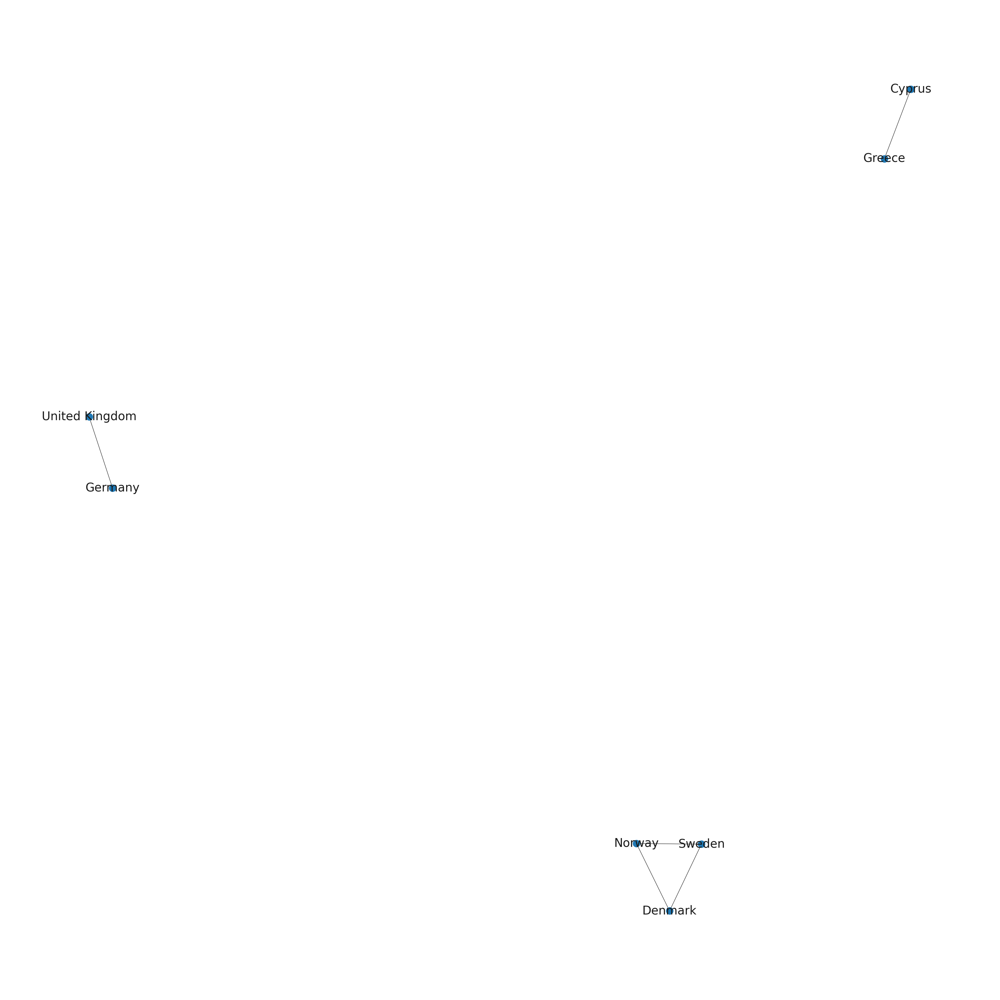

In [87]:
visualise_df(coalitions_1985_1990,35)

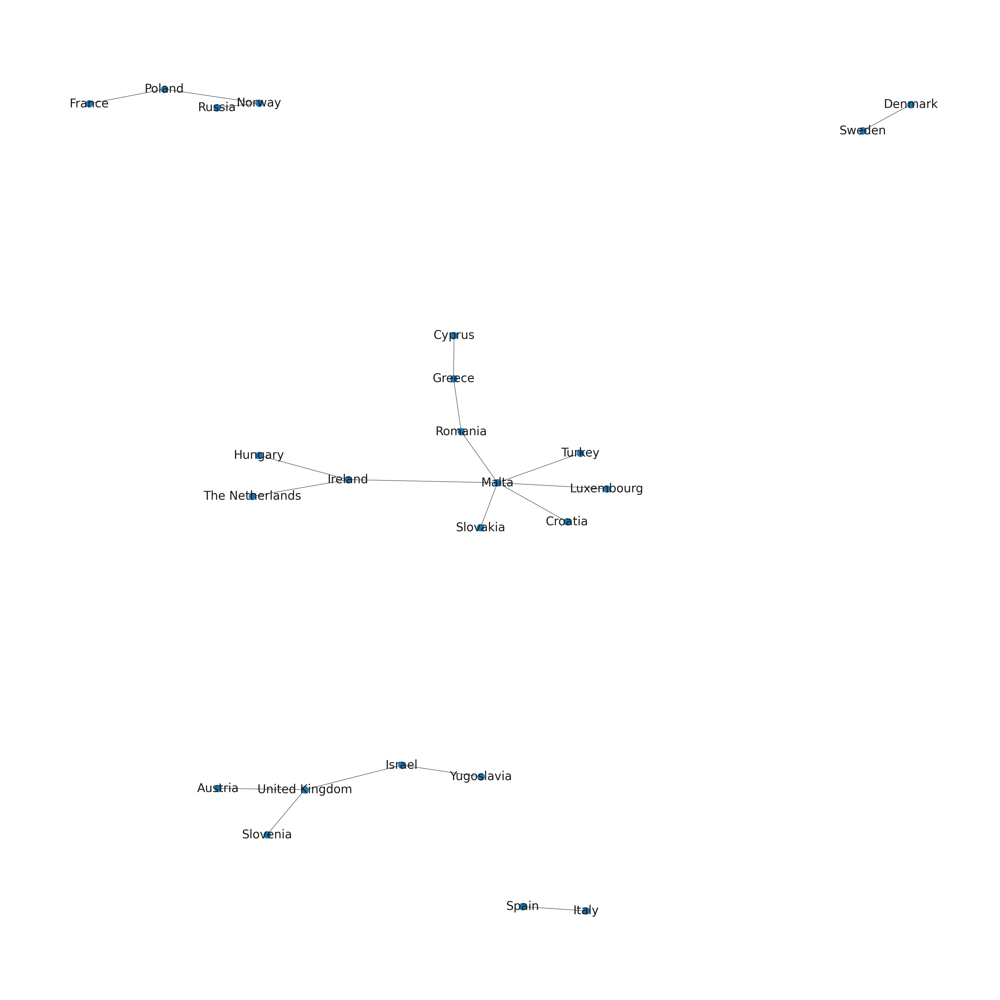

In [88]:
visualise_df(coalitions_1990_1995,35) #visualise

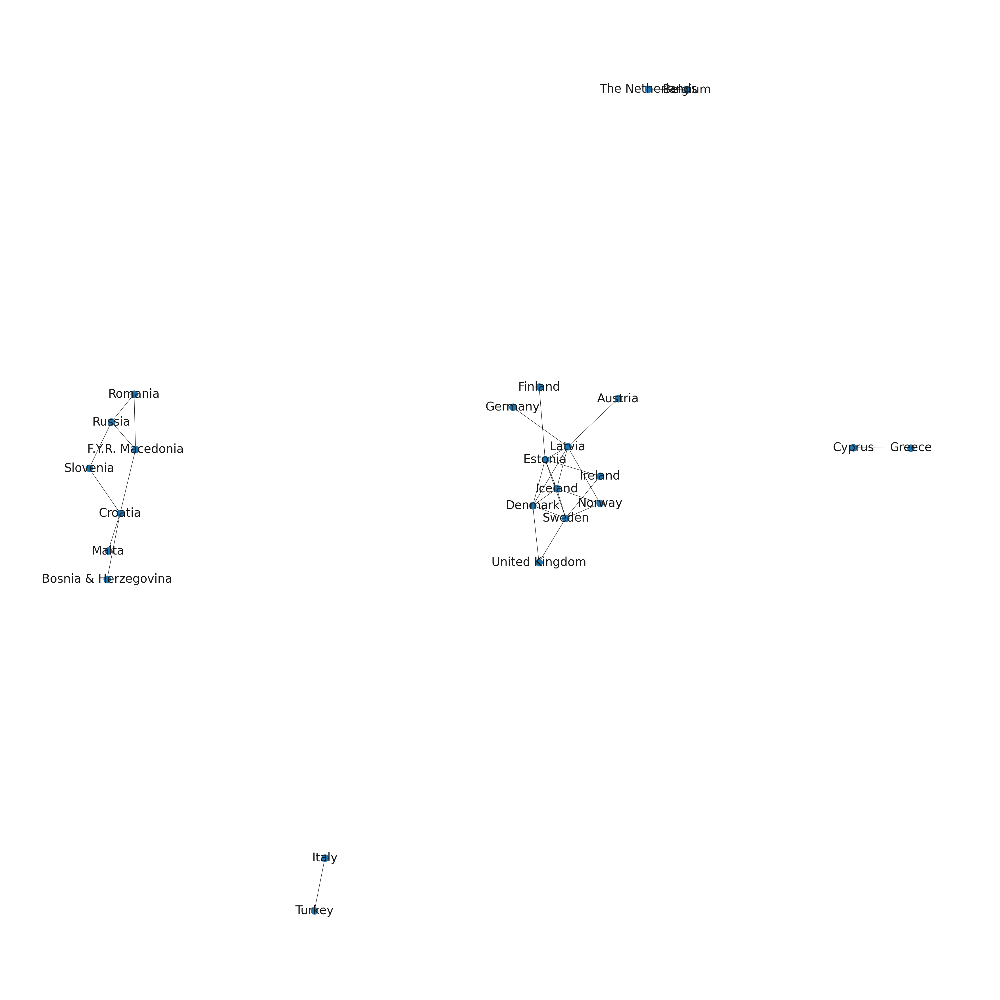

In [89]:
visualise_df(coalitions_1995_2000,35) #visualise

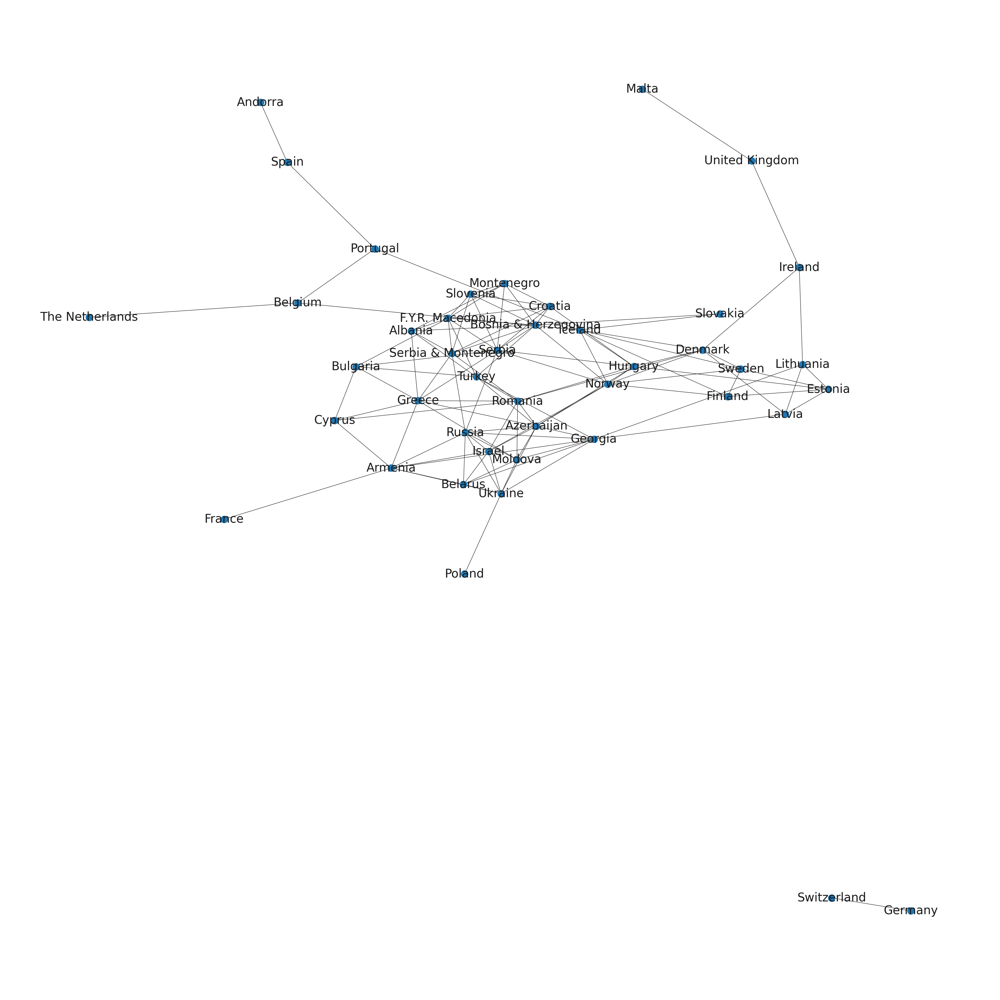

In [90]:
visualise_df(coalitions_2005_2010,35) #visualise

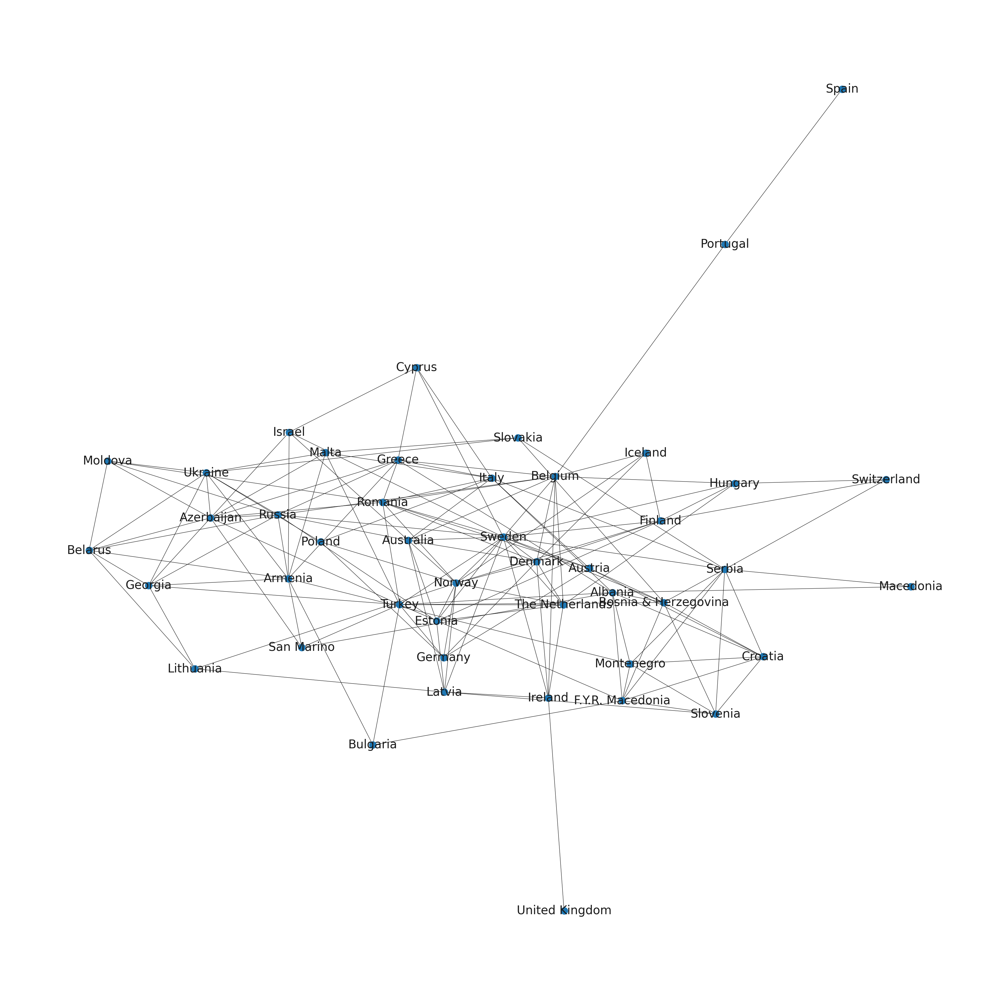

In [91]:
visualise_df(coalitions_2010_2015,35) #visualise

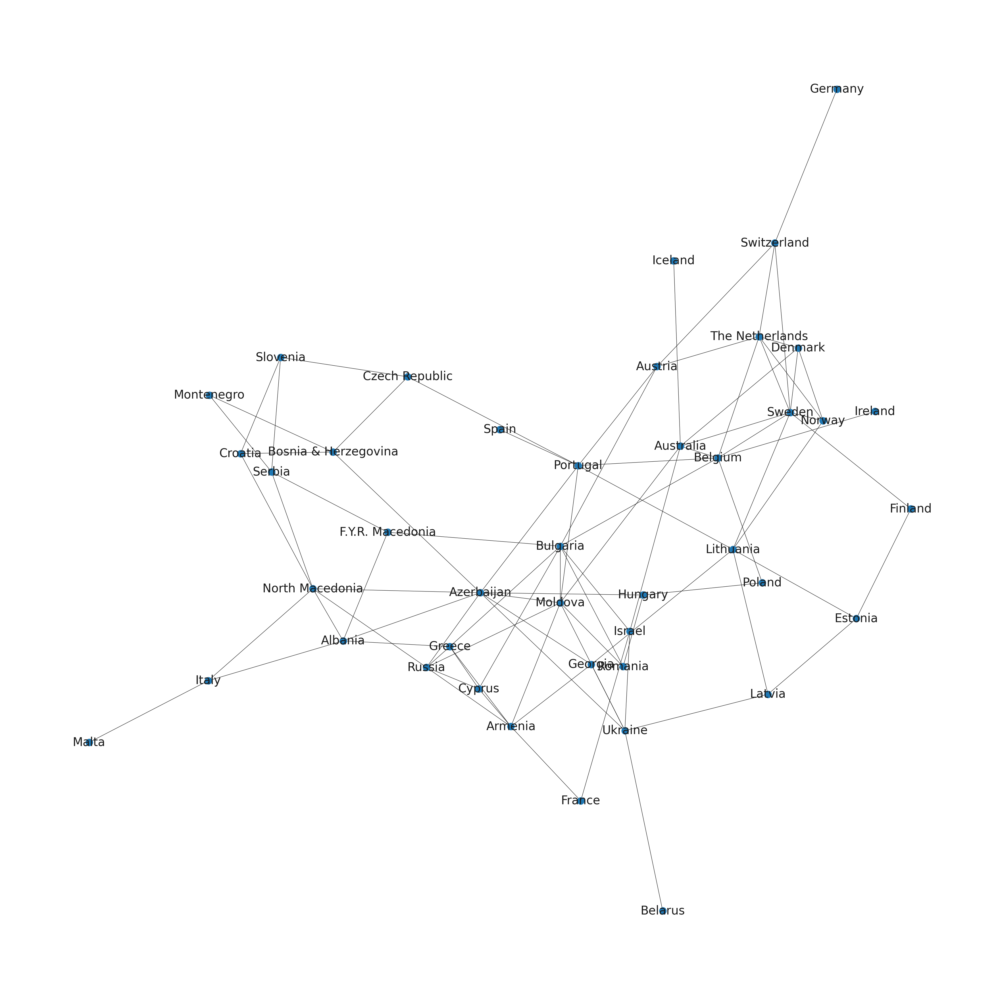

In [92]:
visualise_df(coalitions_2015_2019,35) #visualise

### Predicted Pattern from (2019-2023)

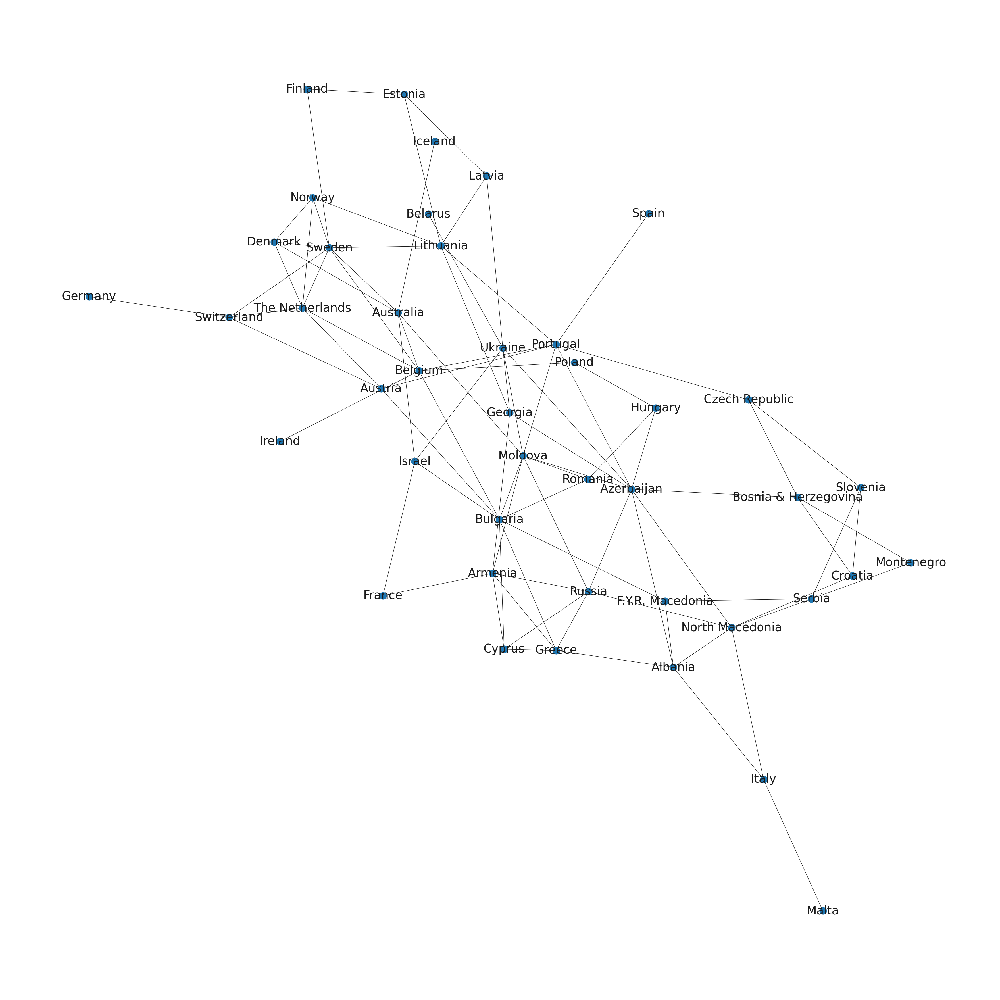

In [93]:
#Predicted Patterns of Monte Carlo Analysis
visualise_df(coalitions_2019_2023,35)

# Word  & Sentiment Analysis

In [95]:
# Function processes a given lyric by removing unwanted characters or symbols, splitting it into individual words,
#and returning the words as a string.
def lyrics_to_words(lyric):

    cleaned_lyric = clean_lyrics(lyric)


    words = cleaned_lyric.split()


    return ' '.join(words)

In [96]:
import re

def clean_lyrics(lyric):


    cleaned_lyric = re.sub(r"[^\w\s]", "", lyric)
    return cleaned_lyric

def lyrics_to_words(lyric):
    # Split the lyric into words
    words = lyric.split()
    return words


In [101]:
# CREATE and ADD a COLUMN WITH THE NAME OF WORDS

# Create an empty list to store the unique words of each lyric song
words = []
Eurovision_lyrics2022.reset_index(drop=True)


for lyric in Eurovision_lyrics2022['Lyrics']:
    unique_words = set(lyrics_to_words(lyric))
    words.append(unique_words)


Eurovision_lyrics2022['words'] = words

# Display the updated DataFrame
Eurovision_lyrics2022.head()

,Country,Artist,Language,Sc.,Year,Lyrics,Lyrics translation,Decade,words
0,Netherlands,Jetty Paerl,Dutch,0.0,1956,De vogels van Holland zijn zo muzikaal\nZe ler...,The birds of Holland are so musical\nThey alre...,1950s,"{allemaal, noorden, westen,, goed, Om, vogels,..."
1,Switzerland,Lys Assia,German,0.0,1956,Das alte Karussell\nDas geht nicht mehr so sch...,The old carousel\nIt doesn't go as fast anymor...,1950s,"{traben, Orgelspiel, zu, Man, Pferdchen, Ein, ..."
2,Belgium,Fud Leclerc,French,0.0,1956,Messieurs les noyés de la Seine\nOuvrez-moi le...,Ye drowned men of the river Seine (1)\nOpen th...,1950s,"{sans, portes, Des, Ne, La, d'user, voyagé, tr..."
3,Germany (West),Walter Andreas Schwarz,German,0.0,1956,Es gibt einen Hafen\nDa fährt kaum ein Schiff\...,There is a harbour\nWhere hardly any ship leav...,1950s,"{Glück, für, übers, vorbei, Hafen, ja, stehen,..."
4,France,Mathé Altéry,French,0.0,1956,"Chante, carillon\nLe chant du temps perdu\nCha...","Sing, carillon\nThe song of lost time\nSing yo...",1950s,"{sans, jour, presser, seul, soir, Nos, légère,..."


In [102]:
# Because we Want to Analyse according to Decade, We add Decade to our DataSet
#Add Decades to it
Eurovision_lyrics2022['Year'] = Eurovision_lyrics2022['Year'].astype(str)
# Extract the first three characters from the 'Year' column to get the decade
Eurovision_lyrics2022['Decade'] = Eurovision_lyrics2022['Year'].str[:3] + '0s'

In [103]:
Eurovision_lyrics2022

,Country,Artist,Language,Sc.,Year,Lyrics,Lyrics translation,Decade,words
0,Netherlands,Jetty Paerl,Dutch,0.0,1956,De vogels van Holland zijn zo muzikaal\nZe ler...,The birds of Holland are so musical\nThey alre...,1950s,"{allemaal, noorden, westen,, goed, Om, vogels,..."
1,Switzerland,Lys Assia,German,0.0,1956,Das alte Karussell\nDas geht nicht mehr so sch...,The old carousel\nIt doesn't go as fast anymor...,1950s,"{traben, Orgelspiel, zu, Man, Pferdchen, Ein, ..."
2,Belgium,Fud Leclerc,French,0.0,1956,Messieurs les noyés de la Seine\nOuvrez-moi le...,Ye drowned men of the river Seine (1)\nOpen th...,1950s,"{sans, portes, Des, Ne, La, d'user, voyagé, tr..."
3,Germany (West),Walter Andreas Schwarz,German,0.0,1956,Es gibt einen Hafen\nDa fährt kaum ein Schiff\...,There is a harbour\nWhere hardly any ship leav...,1950s,"{Glück, für, übers, vorbei, Hafen, ja, stehen,..."
4,France,Mathé Altéry,French,0.0,1956,"Chante, carillon\nLe chant du temps perdu\nCha...","Sing, carillon\nThe song of lost time\nSing yo...",1950s,"{sans, jour, presser, seul, soir, Nos, légère,..."
...,...,...,...,...,...,...,...,...,...
1679,Sweden,Cornelia Jakobs,English,438.0,2022,No need to apologise\nCuz there‘s nothing to r...,English,2020s,"{bye, right,, help, that‘s, it, of, you‘re, fo..."
1680,Switzerland,Marius Bear,English,78.0,2022,"In my room, lives a boy who could be blue,\nAn...",English,2020s,"{up,, dry,, we, run, you‘d, When, boy, fear, l..."
1681,The Netherlands,S10,Dutch,171.0,2022,"Ken je het gevoel dat, dat je droom niet uitko...",Do you know the feeling\nYour dream is never c...,2020s,"{god, zie, jou, lijk, genoeg, bang, dat, oh, g..."
1682,Ukraine,Kalush Orchestra,Ukrainian,631.0,2022,"Стефанія мамо мамо Стефанія,\nРозквітає поле, ...",Mother Stephania Stephania mother\nThe field i...,2020s,"{завжди, забрати, нерви, піку, більше, обманут..."


### 8- Winning Languages

In [105]:
# Group by Decade and Language
language_counts = Eurovision_lyrics2022.groupby(
    ['Decade', 'Language']
).size().reset_index(name='Count')

# Select the most common language per decade
most_common_languages = (
    language_counts
    .groupby('Decade')[['Language', 'Count']]   # <-- use double brackets!
    .apply(lambda x: x.nlargest(1, 'Count'))
    .reset_index(drop=True)
)

most_common_languages


,Language,Count
0,French,15
1,French,40
2,English,37
3,French,26
4,English,38
5,English,179
6,English,271
7,English,78


In [106]:
language_counts

,Decade,Language,Count
0,1950s,Danish,3
1,1950s,Dutch,7
2,1950s,English,2
3,1950s,French,15
4,1950s,German,9
...,...,...,...
368,2020s,Serbian,3
369,2020s,Slovenian,2
370,2020s,Spanish,2
371,2020s,Spanish/English,1


In [107]:
# Assuming you have already defined 'Eurovision_lyrics2022'

# Convert the 'Sc.' column to numeric type, handling any errors
Eurovision_lyrics2022['Sc.'] = pd.to_numeric(Eurovision_lyrics2022['Sc.'], errors='coerce')

# Remove the NaN values and determine the maximum score with its corresponding Year, Language, and Country
highest_scores = Eurovision_lyrics2022.dropna(subset=['Sc.']).groupby('Year').apply(lambda x: x.loc[x['Sc.'].idxmax()])

# Count the occurrences of each language in the highest scores
language_counts = highest_scores['Language'].value_counts()

# Create a DataFrame with language counts
language_df = pd.DataFrame({'Language': language_counts.index, 'Count': language_counts.values})

# Sort the DataFrame by the count in descending order
language_df = language_df.sort_values('Count', ascending=False)

# Create the histogram using Plotly Express
fig = px.bar(
    language_df,
    x='Language',
    y='Count',
    color='Count',
    color_continuous_scale='Viridis',
    title='Language Distribution of Highest Scores in Eurovision'
)

# Customize the appearance of the plot
fig.update_layout(
    xaxis_title='Language',
    yaxis_title='Count',
    showlegend=False,
    height=500,
    width=800
)

fig.show()

/tmp/ipython-input-1487483622.py:7: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [108]:

data = {'Decade': ['1950s','1960s', '1970s', '1980s','1990s','2000s','2010s','2020s'],
        'Language': ['French', 'French', 'English', 'French', 'English', 'English', 'English', 'English'],
       'Count': [15 , 40 , 37 , 26 , 38, 179 , 271 , 78]}
#
most_common_languages1= pd.DataFrame(data)
most_common_languages1

,Decade,Language,Count
0,1950s,French,15
1,1960s,French,40
2,1970s,English,37
3,1980s,French,26
4,1990s,English,38
5,2000s,English,179
6,2010s,English,271
7,2020s,English,78


## Word Frequency Analysis

In [109]:
languages = ['english', 'german', 'spanish', 'french', 'dutch', 'italian', 'danish', 'swedish', 'finnish', 'slovene', 'greek', 'turkish', 'arabic', 'romanian', 'hungarian', 'russian']
#Create a list of stop words of all languages included in nltk package.
#Stop words are common words that are often removed from text during natural language processing tasks as they do not add significant meaning to the text.
stop_words = []
for language in languages:
  stop_words.extend(stopwords.words(language))
stop_words.extend(["oh", "cest"]) #These words appear a lot but don't add any meaning

#Split the dataset into decades
decades = ['1950s', '1960s', '1970s', '1980s', '1990s', '2000s', '2010s', '2020s']
df_decade_list = []
for decade in decades:
  df_decade_list.append(Eurovision_lyrics2022[Eurovision_lyrics2022['Decade'] == decade])

#Create a data_frame of words used per decade
df_word_list = []
for decade_df, decade_choice in zip(df_decade_list, decades):
  set_words = []
  set_decades = []
  for i in decade_df.index:
    for word in decade_df['words'].loc[i]:
      if word == 'lamour':
        set_words.append('amour') #replace l'amour with amour
      else:
        set_words.append(word)
      set_decades.append(decade_df['Decade'].loc[i])
  words_df = pd.DataFrame({'words':set_words, 'decade':set_decades})

#Count the word frequencies per decade and place them into a list of datasets per decade
  cv = CountVectorizer(stop_words = stop_words)
  text_cv = cv.fit_transform(words_df['words'])
  data_cv = pd.DataFrame(text_cv.toarray(), columns=cv.get_feature_names_out()) #get_feature_names())
  data_cv['decade'] = words_df['decade']
  vect_words = data_cv.groupby('decade').sum().T
  vect_words = vect_words.reset_index(level=0).rename(columns = {'index':'words'})
  vect_words = vect_words.rename_axis(columns='')
  vect_words = vect_words[['words', decade_choice]]
  df_word_list.append(vect_words)

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['printr', 'δι', 'آمين', 'أب', 'أخ', 'أفعل', 'أفعله', 'ؤلاء', 'إل', 'إم', 'ات', 'اتان', 'ارتد', 'ان', 'انفك', 'برح', 'تان', 'تبد', 'تحو', 'تعل', 'حد', 'حم', 'حي', 'خب', 'ذار', 'سيما', 'صه', 'ظل', 'ظن', 'عد', 'قط', 'مر', 'مكان', 'مكانكن', 'نب', 'هات', 'هب', 'واها', 'وراء', 'ἀλλ'] not in stop_words.

/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['printr', 'δι', 'آمين', 'أب', 'أخ', 'أفعل', 'أفعله', 'ؤلاء', 'إل', 'إم', 'ات', 'اتان', 'ارتد', 'ان', 'انفك', 'برح', 'تان', 'تبد', 'تحو', 'تعل', 'حد', 'حم', 'حي', 'خب', 'ذار', 'سيما', 'صه', 'ظل', 'ظن', 'عد', 'قط', 'مر', 'مكان', 'مكانكن', 'نب', 'هات', 'هب', 'واها', 'وراء', 'ἀλλ'] not in stop_words.

/usr

In [110]:
for decade_choice, i in zip(decades, range(len(decades))):
  print("Most Popular Word of the {} is {}".format(decade_choice, df_word_list[i]['words'].iloc[df_word_list[i][decades[i]].idxmax()]))

Most Popular Word of the 1950s is amour
Most Popular Word of the 1960s is amour
Most Popular Word of the 1970s is amour
Most Popular Word of the 1980s is amour
Most Popular Word of the 1990s is yeah
Most Popular Word of the 2000s is love
Most Popular Word of the 2010s is chorus
Most Popular Word of the 2020s is like


In [111]:
#To plot word clouds for each decade based on the word frequencies in the provided data
def plot_wordcloud(df):
  wc = WordCloud(background_color="white",colormap="Dark2", max_font_size=100,random_state=15)
  fig = plt.figure(figsize=(20,10))
  for index, value in enumerate(df.columns[1:]):
    top_dict = dict(zip(df['words'].tolist(),df[value].tolist()))
    wc.generate_from_frequencies(top_dict)
    plt.imshow(wc,interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{value}",fontsize=15)
  plt.show()

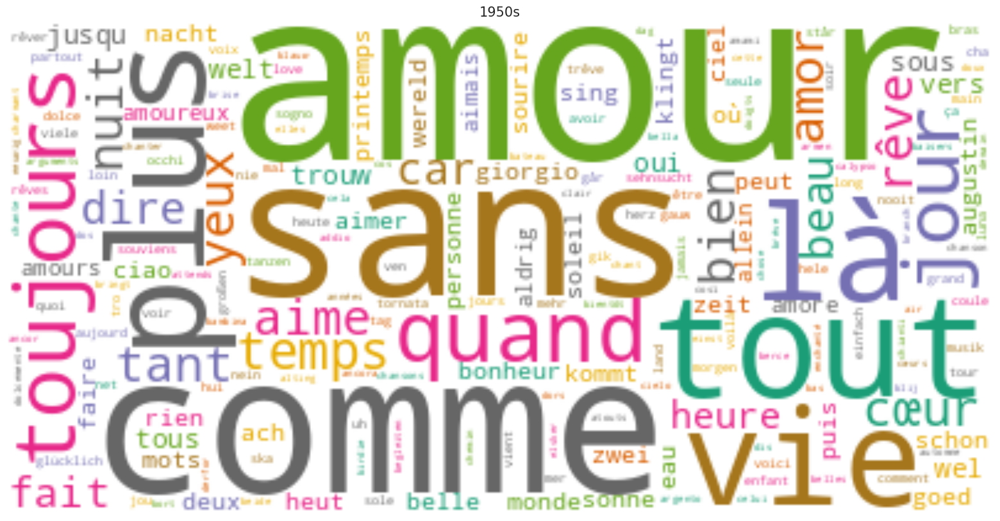

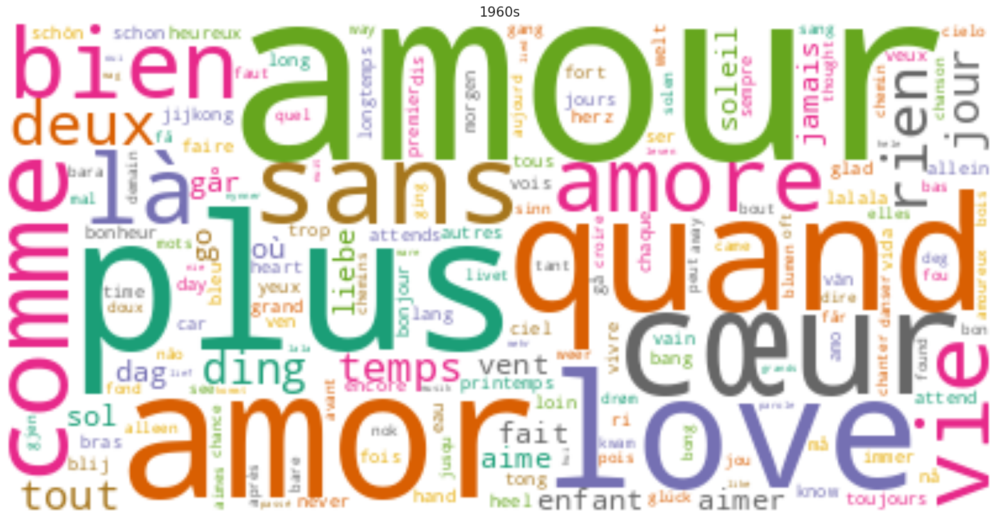

In [112]:
plot_wordcloud(df_word_list[0])
plot_wordcloud(df_word_list[1])


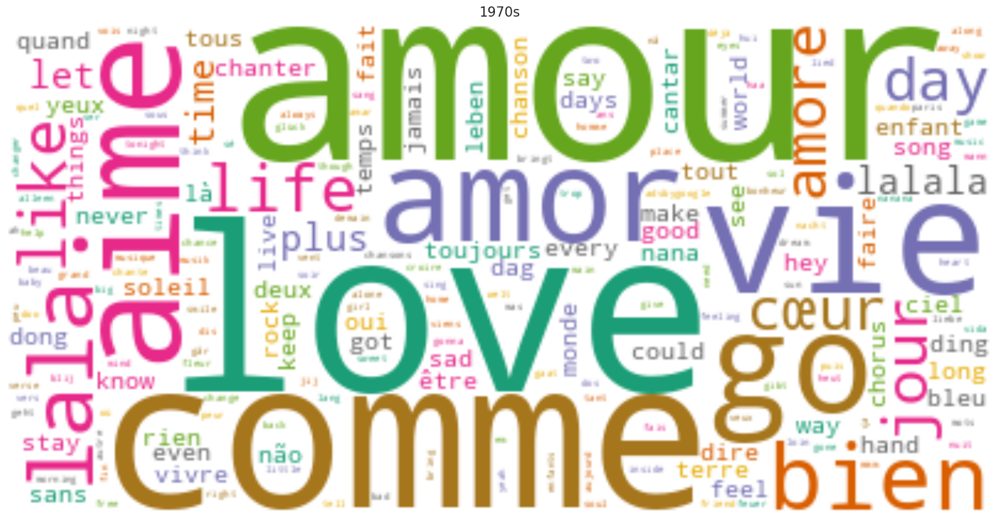

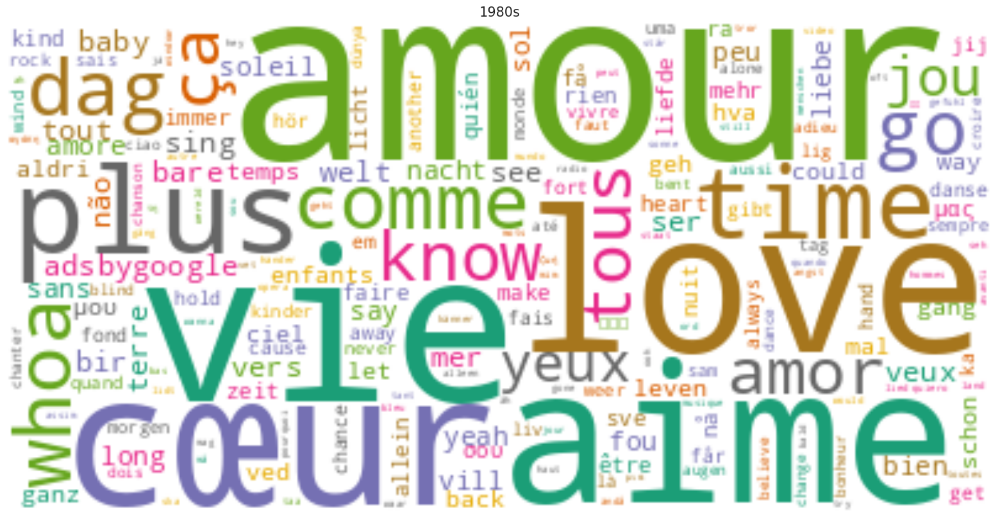

In [113]:
plot_wordcloud(df_word_list[2])
plot_wordcloud(df_word_list[3])

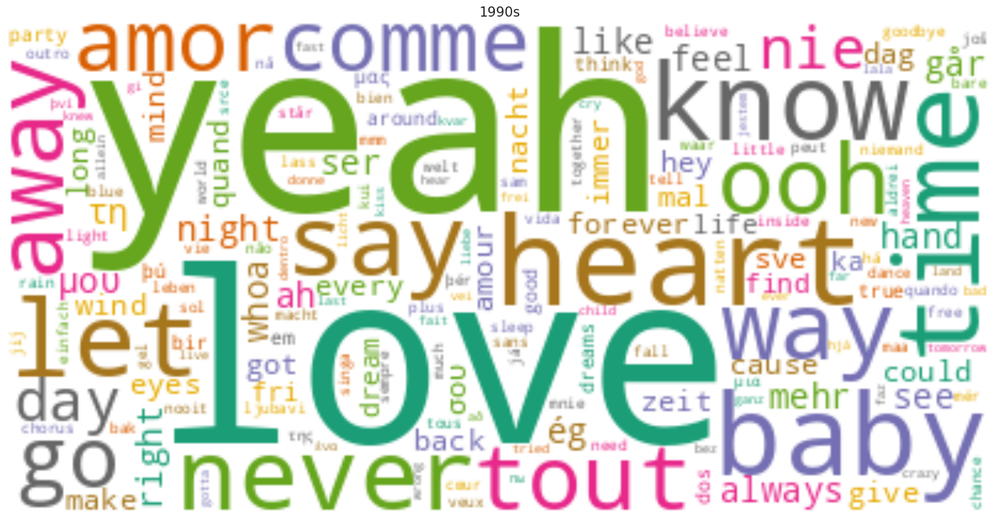

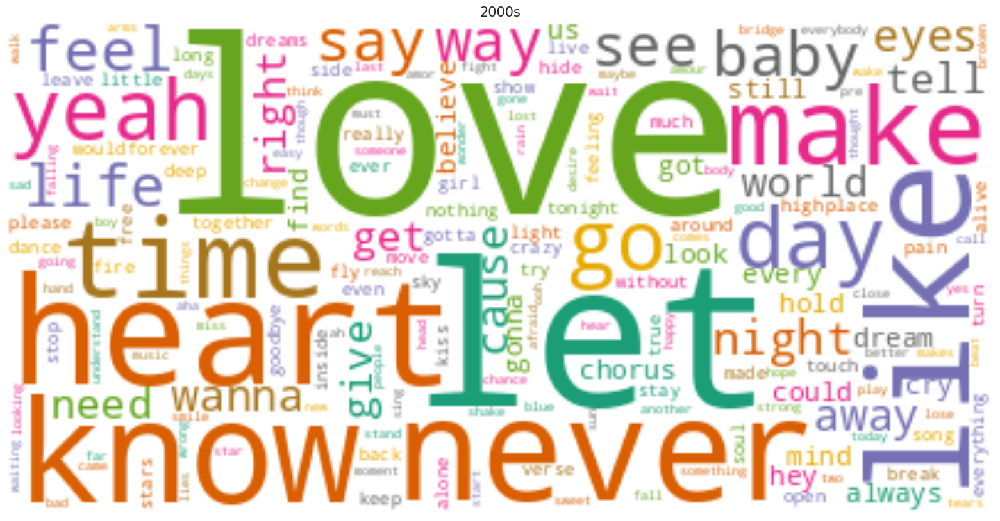

In [114]:
plot_wordcloud(df_word_list[4])
plot_wordcloud(df_word_list[5])


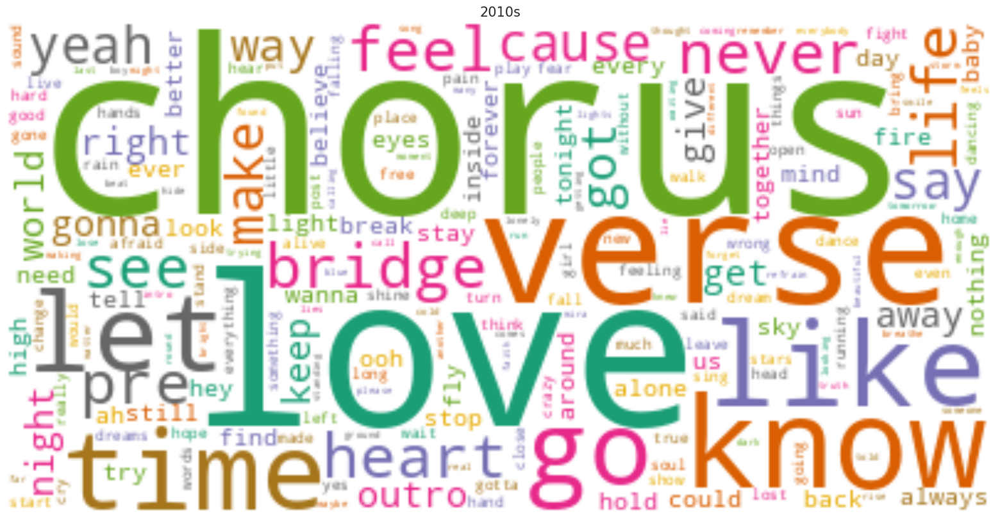

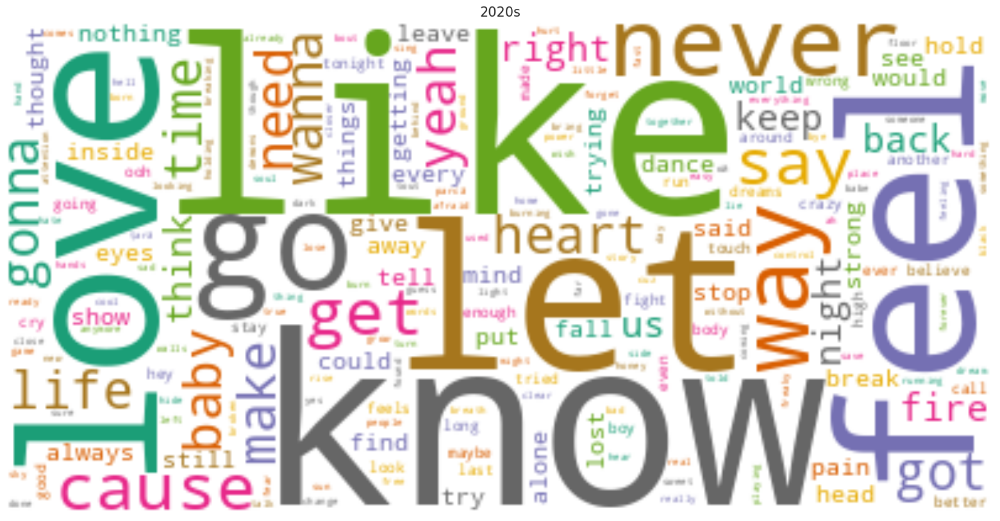

In [115]:
plot_wordcloud(df_word_list[6])
plot_wordcloud(df_word_list[7])

### 9- The Average Number of Words in Each Song in different Decades

In [116]:
def word_stats(df_list, main_df):
  unique_words = []
  total_words =  []
  total_news = []
  years = []

  for decade_df in df_list:
    for value in decade_df.columns[1:]:
      unique_words.append(np.count_nonzero(decade_df[value]))
      total_words.append(sum(decade_df[value].tolist()))
      years.append(str(value))
      total_news.append(main_df['Decade'][main_df['Decade']==value].count())
  data = pd.DataFrame({'decade':years, 'unique words':unique_words,'total words':total_words,'total songs':total_news})
  data['words per songs'] = round(data['total words'] / data['total songs'],0)
  data['words per songs'] = data['words per songs'].astype('int')
  return data

In [117]:
word_stats(df_word_list,Eurovision_lyrics2022)

,decade,unique words,total words,total songs,words per songs
0,1950s,1839,2498,45,56
1,1960s,4959,7855,163,48
2,1970s,6106,9802,176,56
3,1980s,7038,10821,200,54
4,1990s,8628,13255,236,56
5,2000s,7507,18620,336,55
6,2010s,8103,23551,408,58
7,2020s,3354,6802,120,57


/tmp/ipython-input-2847634734.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




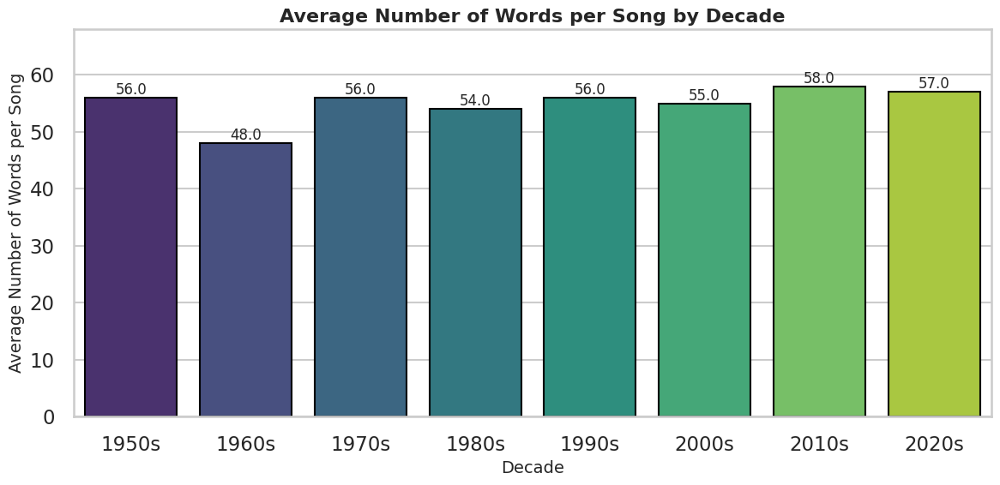

In [119]:

# Define the data
decades = ['1950s', '1960s', '1970s', '1980s', '1990s', '2000s', '2010s', '2020s']
words_per_song = [56, 48, 56, 54, 56, 55, 58, 57]

# Prepare the DataFrame
df = pd.DataFrame({'Decade': decades, 'Words per Song': words_per_song})

# Set Seaborn style for scientific visualization
sns.set(style="whitegrid", context="talk")

# Create the bar chart
plt.figure(figsize=(12, 6))
barplot = sns.barplot(
    data=df,
    x='Decade',
    y='Words per Song',
    palette='viridis',  # scientifically friendly colormap
    edgecolor='black'
)

# Annotate bars with values
for p in barplot.patches:
    height = p.get_height()
    barplot.annotate(f'{height}',
                     (p.get_x() + p.get_width() / 2., height),
                     ha='center', va='bottom', fontsize=12)

# Labels and title
plt.xlabel("Decade", fontsize=14)
plt.ylabel("Average Number of Words per Song", fontsize=14)
plt.title("Average Number of Words per Song by Decade", fontsize=16, fontweight='bold')
plt.ylim(0, max(words_per_song) + 10)
plt.tight_layout()

# Show the plot
plt.show()


## Sentiment (Polarity and Subjectivity) Analysis

### 1- Polarity Analysis

- Polarity Analysis: It is Natural language processing (NLP) technique used to determine the (SENTIMENT OR EMOTIONAL TONE) expressed in a piece of text.

- The Numbers represent the sentiment polarity of the text, indicating whether the sentiment expressed in the text is positive, negative, or neutral. A positive polarity score indicates that the text expresses a positive sentiment.

- Example of Positive Plority:  "I absolutely loved the movie! The plot was engaging, the characters were lovable, and the acting was top-notch. I can't wait to watch it again!"

In [120]:
#calculates the POLARITY SENTIMENT ANALYSE using the TextBlob library for each set of lyrics
polarity = []

# Iterate for each row of lyrics and append the scores
for i in Eurovision_lyrics2022.index:
    # Create text blobs for each of the song lyrics
    if Eurovision_lyrics2022['Lyrics translation'].iloc[i] == "english":
        blob = TextBlob(Eurovision_lyrics2022['Lyrics'].iloc[i])
    else:
        blob = TextBlob(Eurovision_lyrics2022['Lyrics translation'].iloc[i])
    polarity.append(blob.sentiment.polarity)  # Retrieve polarity score

# Create a column for the polarity score
Eurovision_lyrics2022['Polarity_Sentiment_Analyse'] = polarity


In [121]:
df_decade = []
for d in decades:
  df_decade.append(Eurovision_lyrics2022[Eurovision_lyrics2022['Decade'] == d])

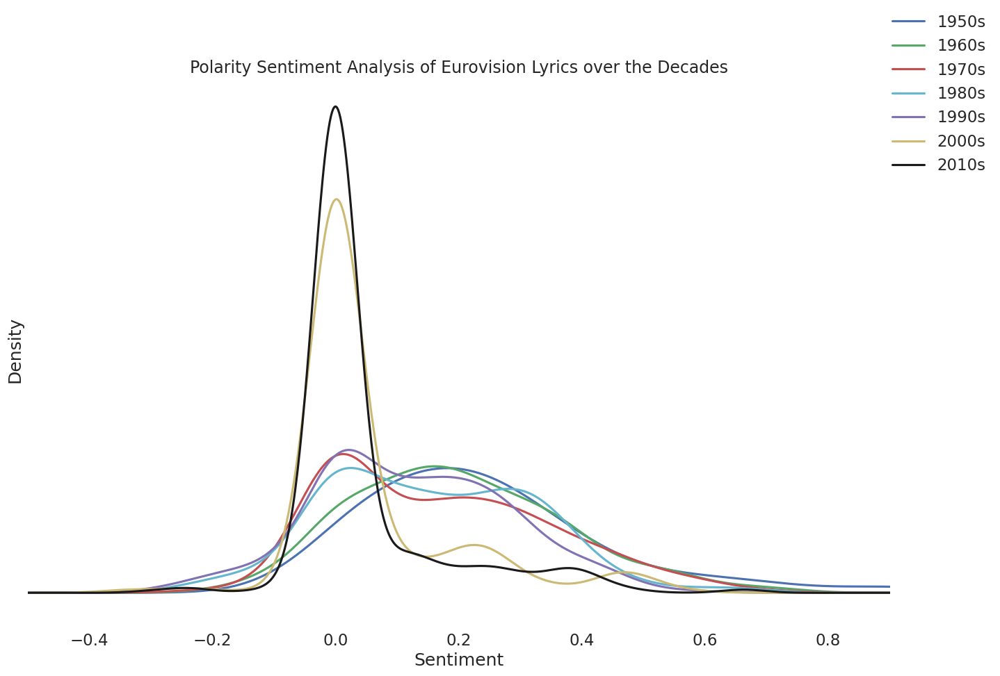

In [122]:
fig, ax = plt.subplots(figsize=(16, 10))
colors = "bgrcmyk"

# Print a KDE for each decade
for data, decade_c, c in zip(df_decade, decades, colors):
    data["Polarity_Sentiment_Analyse"].plot(kind="kde", c=c, label=decade_c)

# Appearance settings
ax.set_xlabel("Sentiment")
ax.set_ylabel("Density")  # Update the title for the y-axis
ax.set_xlim(-0.5, 0.9)
ax.grid(False)
ax.set_xlabel("Sentiment")
ax.set_yticks([])
ax.set_title("Polarity Sentiment Analysis of Eurovision Lyrics over the Decades", size=17, pad=10)
plt.style.use("bmh")

# Hide spines
for spine in ax.spines.values():
    spine.set_visible(False)

fig.legend()
plt.show()

## Analysing Subjectivity(or Objectivity)

- SUBJECTIVITY: Refers to what Extent The Sentence Express PERSONAL (Feelings, Opinions, or Judgments).

- Example of Subjectivity: "In my opinion, the new restaurant in town has the best pizza ever! The crust is perfectly crispy, and the toppings are so delicious. I highly recommend trying it out!"


- OBJECTIVITY: VERIFIABLE FACTS Without EXPRESSING any PERSONAL OPINION or EMOTIONAL Content.
- Example of Objectivity:  "Water boils at 100 degrees Celsius at standard atmospheric pressure."

In [123]:
# Create lists to store the different scores for each set of lyrics
subjectivity = []
# Iterate for each row of lyrics and append the scores
for i in Eurovision_lyrics2022.index:
    # Create text blobs for each of the song lyrics
    if Eurovision_lyrics2022['Lyrics translation'].iloc[i] == "english":
        blob = TextBlob(Eurovision_lyrics2022['Lyrics'].iloc[i])
    else:
        blob = TextBlob(Eurovision_lyrics2022['Lyrics translation'].iloc[i])
    subjectivity.append(blob.sentiment.subjectivity)  # Change index to retrieve subjectivity score

    # Create a column for the polarity score
Eurovision_lyrics2022['Subjectivity_Sentiment_Analyse'] = subjectivity

In [124]:
df_decade = []
for d in decades:
  df_decade.append(Eurovision_lyrics2022[Eurovision_lyrics2022['Decade'] == d])

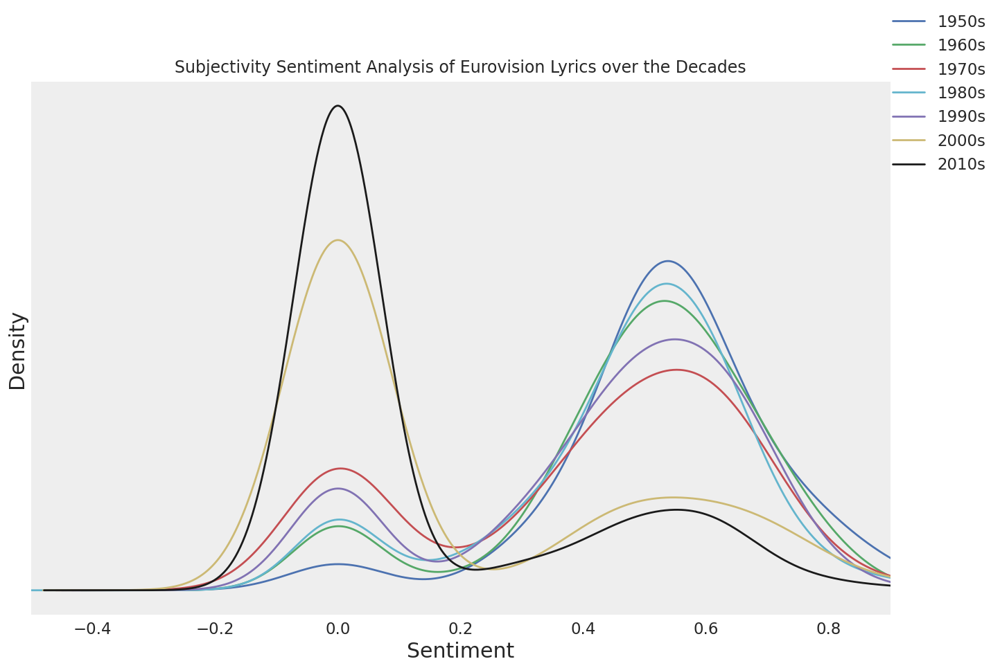

In [125]:
fig, ax = plt.subplots(figsize=(16, 10))
colors = "bgrcmyk"

# Print a KDE for each decade
for data, decade_c, c in zip(df_decade, decades, colors):
    data["Subjectivity_Sentiment_Analyse"].plot(kind="kde", c=c, label=decade_c)

# Appearance settings
ax.set_xlabel("Sentiment")
ax.set_ylabel("Density")  # Update the title for the y-axis
ax.set_xlim(-0.5, 0.9)
ax.grid(False)
ax.set_xlabel("Sentiment")
ax.set_yticks([])
ax.set_title("Subjectivity Sentiment Analysis of Eurovision Lyrics over the Decades", size=17, pad=10)
plt.style.use("bmh")

# Hide spines
for spine in ax.spines.values():
    spine.set_visible(False)

fig.legend()
plt.show()